# IBM Applied Data Science Capstone 

## Comparing the boroughs in London

London city, capital of the United Kingdom is one of the world's most important global cities. It is among the oldest of the world’s great cities—its history spanning nearly two millennia—and one of the most cosmopolitan. By far Britain’s largest metropolis, it is also the country’s economic, transportation, and cultural centre. London is a very diverse city with a population of over 8 million people with a land area of 1,572 square kilometres. 

Finding a destination, or a place to move to can be challenging. This project aims to help tourists and people that intend to move to London, find the best destinations and neighbourhoods based on the most common venues, crime rates and housing prices. This project analyzes the neighbourhoods in London and cluster them based on venues. The clustering algorithm that will be used is K Means. K means was chosen because it is one of the simplest algorithms for clustering. 

## Data
### Data requirements
Data containing the boroughs and neighbourhoods is required, as well as data containing neighbourhood locations, crime rates, house prices and venues.
### Data description
The data containing neighbourhoods in London was scraped from [Wikipedia](https://en.wikipedia.org/wiki/List_of_areas_of_London). 

The Wikipedia page lacked information about the coordinates of the neighbourhoods. Therefore, Geocoder library was used to fetch the coordinates for each neighbourhood.

The data containing crime rates in London boroughs was gotten from [finder.com](https://www.finder.com/uk/london-crime-statistics). The webpage contained information of the crime rates per 1000 people and the total number of crimes reported for each borough in 2020.

The average housing price, as well as price per square feet in each London neighbourhood was gotten from [propertydata.co.uk](https://propertydata.co.uk/cities/london). 

Foursquare api was used to get data of all the venues and their categories for each London neighbourhood. Foursquare is an American location data provider.

Finally, coordinates for each borough was gotten from this geojson file


### Import Libraries that will be used throughout the project
This includes librariesfor data analysis, visualizations and locations.

In [86]:
import requests # library to handle requests
import pandas as pd # library for data analsysis
import numpy as np # library to handle data in a vectorized manner
import random # library for random number generation
import itertools

#Libraries for plots
import seaborn as sns
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import folium

# module to convert an address into latitude and longitude values
from geopy.geocoders import Nominatim
import geocoder

# libraries for displaying images
from IPython.display import Image 
from IPython.core.display import HTML 
    
# tranforming json file into a pandas dataframe library
from pandas.io.json import json_normalize

#Library for k-mean algoritm
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from yellowbrick.cluster import KElbowVisualizer

print('Libraries imported.')

Libraries imported.


### Fetch data containing the list of areas and boroughs in London

This data is scraped from wikipedia. Click [here](https://en.wikipedia.org/wiki/List_of_areas_of_London) to view the webpage.

In [2]:
url = "https://en.wikipedia.org/wiki/List_of_areas_of_London"
london_areas_url = requests.get(url)
london_areas_url

<Response [200]>

In [3]:
london_data = pd.read_html(london_areas_url.text)
london_data

[                                                   0
 0  Map all coordinates in "Category:Areas of Lond...
 1                 Download coordinates as: KML · GPX,
             Location                     London borough       Post town  \
 0         Abbey Wood              Bexley, Greenwich [7]          LONDON   
 1              Acton  Ealing, Hammersmith and Fulham[8]          LONDON   
 2          Addington                         Croydon[8]         CROYDON   
 3         Addiscombe                         Croydon[8]         CROYDON   
 4        Albany Park                             Bexley  BEXLEY, SIDCUP   
 ..               ...                                ...             ...   
 526         Woolwich                          Greenwich          LONDON   
 527   Worcester Park       Sutton, Kingston upon Thames  WORCESTER PARK   
 528  Wormwood Scrubs             Hammersmith and Fulham          LONDON   
 529          Yeading                         Hillingdon           HAYES   
 

In [4]:
london_data = london_data[1]
london_data

,Location,London borough,Post town,Postcode district,Dial code,OS grid ref
0,Abbey Wood,"Bexley, Greenwich [7]",LONDON,SE2,020,TQ465785
1,Acton,"Ealing, Hammersmith and Fulham[8]",LONDON,"W3, W4",020,TQ205805
2,Addington,Croydon[8],CROYDON,CR0,020,TQ375645
3,Addiscombe,Croydon[8],CROYDON,CR0,020,TQ345665
4,Albany Park,Bexley,"BEXLEY, SIDCUP","DA5, DA14",020,TQ478728
...,...,...,...,...,...,...
526,Woolwich,Greenwich,LONDON,SE18,020,TQ435795
527,Worcester Park,"Sutton, Kingston upon Thames",WORCESTER PARK,KT4,020,TQ225655
528,Wormwood Scrubs,Hammersmith and Fulham,LONDON,W12,020,TQ225815
529,Yeading,Hillingdon,HAYES,UB4,020,TQ115825


There are 531 neighbourhoods in this dataset

In [5]:
london_data.columns.to_list()

['Location',
 'London\xa0borough',
 'Post town',
 'Postcode\xa0district',
 'Dial\xa0code',
 'OS grid ref']

### Remove columns and characters that will not be useful for this project

The columns 'Post town', 'Dial code' and 'OS grid ref' will be removed because we don't need them

In [6]:
london_data.drop(['OS grid ref', 'Dial\xa0code', 'Post town'], axis=1, inplace=True)
london_data.head(10)

,Location,London borough,Postcode district
0,Abbey Wood,"Bexley, Greenwich [7]",SE2
1,Acton,"Ealing, Hammersmith and Fulham[8]","W3, W4"
2,Addington,Croydon[8],CR0
3,Addiscombe,Croydon[8],CR0
4,Albany Park,Bexley,"DA5, DA14"
5,Aldborough Hatch,Redbridge[9],IG2
6,Aldgate,City[10],EC3
7,Aldwych,Westminster[10],WC2
8,Alperton,Brent[11],HA0
9,Anerley,Bromley[11],SE20


#### Remove square brackets and numbers in the 'London borough' column.

In [7]:
london_data['London\xa0borough'] = london_data['London\xa0borough'].map(lambda x: x.rstrip(']').rstrip('0123456789').rstrip('['))
london_data.head()

,Location,London borough,Postcode district
0,Abbey Wood,"Bexley, Greenwich",SE2
1,Acton,"Ealing, Hammersmith and Fulham","W3, W4"
2,Addington,Croydon,CR0
3,Addiscombe,Croydon,CR0
4,Albany Park,Bexley,"DA5, DA14"


#### Rename the columns as ['Neighbourhood', 'Borough', 'Area']

In [8]:
london_data.columns = ['Neighbourhood', 'Borough', 'Area']
london_data.head()

,Neighbourhood,Borough,Area
0,Abbey Wood,"Bexley, Greenwich",SE2
1,Acton,"Ealing, Hammersmith and Fulham","W3, W4"
2,Addington,Croydon,CR0
3,Addiscombe,Croydon,CR0
4,Albany Park,Bexley,"DA5, DA14"


In [9]:
london_data['Borough'].nunique()

60

### Get the location data for areas in London using geocoder

In [10]:
london_data.head()

,Neighbourhood,Borough,Area
0,Abbey Wood,"Bexley, Greenwich",SE2
1,Acton,"Ealing, Hammersmith and Fulham","W3, W4"
2,Addington,Croydon,CR0
3,Addiscombe,Croydon,CR0
4,Albany Park,Bexley,"DA5, DA14"


#### View the descriptive statistics of the dataframe

In [11]:
london_data.describe(include='all')

,Neighbourhood,Borough,Area
count,531,531,531
unique,525,60,282
top,Coombe,Bromley,CR0
freq,2,35,9


### Get crime rate data of London boroughs in 2020

This data is scraped from finder.com Click [here](https://www.finder.com/uk/london-crime-statistics) to view the webpage

In [12]:
url2 = 'https://www.finder.com/uk/london-crime-statistics'
london_crime_url = requests.get(url2)
london_crime_url

<Response [200]>

In [13]:
london_crime = pd.read_html(london_crime_url.text)
london_crime

[  Year (June-June)  Crime rate per 1,000 citizens  Number of crimes committed
 0        2019/2020                         103.18                      928485
 1        2018/2019                         106.20                      955701
 2        2017/2018                         100.22                      901900
 3        2016/2017                          95.31                      857732
 4        2015/2016                          90.21                      811804
 5        2014/2015                          86.70                      780185
 6        2013/2014                          84.17                      757413
 7        2012/2013                          90.55                      814853
 8        2011/2012                          97.05                      873338
 9        2010/2011                          99.41                      894612,
                    Borough  Crime count       Crime rate
 0     Barking and Dagenham        21189   99.5 per 1,000
 1            

#### View the crime data for London boroughs in 2020

In [14]:
london_crime_2020 = london_crime[1]
london_crime_2020.head()

,Borough,Crime count,Crime rate
0,Barking and Dagenham,21189,"99.5 per 1,000"
1,Barnet,31911,"80.6 per 1,000"
2,Bexley,18323,"73.8 per 1,000"
3,Brent,31725,"96.2 per 1,000"
4,Bromley,25802,"77.6 per 1,000"


#### Remove unwanted characters from the dataframe

In [15]:
london_crime_2020['Crime rate'] = london_crime_2020['Crime rate'].map(lambda x: x.rstrip('1,000').rstrip(' ').rstrip(' per'))
london_crime_2020.head()

,Borough,Crime count,Crime rate
0,Barking and Dagenham,21189,99.5
1,Barnet,31911,80.6
2,Bexley,18323,73.8
3,Brent,31725,96.2
4,Bromley,25802,77.6


In [16]:
london_crime_2020.dtypes

Borough        object
Crime count     int64
Crime rate     object
dtype: object

#### Change the data type of the 'Crime rate' column to float64

In [17]:
london_crime_2020['Crime rate'] = london_crime_2020['Crime rate'].astype('float64')
london_crime_2020.head()

,Borough,Crime count,Crime rate
0,Barking and Dagenham,21189,99.5
1,Barnet,31911,80.6
2,Bexley,18323,73.8
3,Brent,31725,96.2
4,Bromley,25802,77.6


#### Merge the London neighbourhood dataframe and the crime dataframe
We will call the new dataframe 'combined_borough_crime'

In [18]:
combined_borough_crime = pd.merge(left=london_data, right=london_crime_2020)
#Location= combined_borough_crime[['Latitude','Longitude']]
combined_borough_crime.head()

,Neighbourhood,Borough,Area,Crime count,Crime rate
0,Addington,Croydon,CR0,36790,95.1
1,Addiscombe,Croydon,CR0,36790,95.1
2,Coombe,Croydon,CR0,36790,95.1
3,Coulsdon,Croydon,CR5,36790,95.1
4,Croydon,Croydon,CR0,36790,95.1


In [19]:
combined_borough_crime['Borough'].nunique()

32

### Fetch the house price data
This data contains the average price per square feet in Pounds for each London Area

In [20]:
price_path = 'https://propertydata.co.uk/cities/london'
price_url = requests.get(price_path)
price_url

<Response [200]>

In [21]:
london_price = pd.read_html(price_url.text)
london_price

[        0          1           2       3        4             5
 0    Area  Avg yield   Avg price  £/sqft  5yr +/-  Explore data
 1     BR1       3.3%    £454,063    £466     +17%  Explore data
 2     BR2       3.3%    £482,357    £474     +15%  Explore data
 3     BR3       3.3%    £448,269    £503     +15%  Explore data
 4     BR5       3.9%    £419,770    £427     +17%  Explore data
 ..    ...        ...         ...     ...      ...           ...
 213   W12       2.9%    £687,072    £785      +2%  Explore data
 214   W13       2.8%    £597,581    £682      +7%  Explore data
 215   W14       2.5%    £833,058  £1,003      +5%  Explore data
 216   WC1       2.7%    £797,558    £959     +11%  Explore data
 217   WC2       1.7%  £1,692,502  £1,017      +8%  Explore data
 
 [218 rows x 6 columns]]

In [22]:
london_price = london_price[0]
london_price.head()

,0,1,2,3,4,5
0,Area,Avg yield,Avg price,£/sqft,5yr +/-,Explore data
1,BR1,3.3%,"£454,063",£466,+17%,Explore data
2,BR2,3.3%,"£482,357",£474,+15%,Explore data
3,BR3,3.3%,"£448,269",£503,+15%,Explore data
4,BR5,3.9%,"£419,770",£427,+17%,Explore data


We need to reset the columns and clean the data of unwanted columns

#### Reset the columns

In [23]:
london_price.columns = london_price.iloc[0]
london_price.head()

,Area,Avg yield,Avg price,£/sqft,5yr +/-,Explore data
0,Area,Avg yield,Avg price,£/sqft,5yr +/-,Explore data
1,BR1,3.3%,"£454,063",£466,+17%,Explore data
2,BR2,3.3%,"£482,357",£474,+15%,Explore data
3,BR3,3.3%,"£448,269",£503,+15%,Explore data
4,BR5,3.9%,"£419,770",£427,+17%,Explore data


In [24]:
london_price.drop(london_price.index[0], inplace=True)
london_price.reset_index(drop=True, inplace=True)
london_price.head()

,Area,Avg yield,Avg price,£/sqft,5yr +/-,Explore data
0,BR1,3.3%,"£454,063",£466,+17%,Explore data
1,BR2,3.3%,"£482,357",£474,+15%,Explore data
2,BR3,3.3%,"£448,269",£503,+15%,Explore data
3,BR5,3.9%,"£419,770",£427,+17%,Explore data
4,BR6,3.0%,"£544,046",£474,+16%,Explore data


#### Drop unwanted columns

In [25]:
london_price.drop(['Avg yield',  '5yr +/-', 'Explore data'], axis=1, inplace=True)
london_price.head()

,Area,Avg price,£/sqft
0,BR1,"£454,063",£466
1,BR2,"£482,357",£474
2,BR3,"£448,269",£503
3,BR5,"£419,770",£427
4,BR6,"£544,046",£474


#### Remove the '£' sign from the dataset

In [26]:
london_price['Avg price'] = london_price['Avg price'].map(lambda x: x.lstrip('£'))
london_price['£/sqft'] = london_price['£/sqft'].map(lambda x: x.lstrip('£'))
london_price.head()

,Area,Avg price,£/sqft
0,BR1,"454,063",466
1,BR2,"482,357",474
2,BR3,"448,269",503
3,BR5,"419,770",427
4,BR6,"544,046",474


#### Remove the comma sign from anywhere it appears in the dataframe
This will prevent errors in our calculations and plots

In [27]:
london_price['£/sqft']=london_price['£/sqft'].str.replace(',','')
london_price['Avg price']=london_price['Avg price'].str.replace(',','')
london_price.head()

,Area,Avg price,£/sqft
0,BR1,454063,466
1,BR2,482357,474
2,BR3,448269,503
3,BR5,419770,427
4,BR6,544046,474


#### Chnge the data types of the '£/sqft' and 'Avg price' columns to float64

In [28]:
london_price[['£/sqft', 'Avg price']] = london_price[['£/sqft', 'Avg price']].astype('float64')
london_price.head()

,Area,Avg price,£/sqft
0,BR1,454063.0,466.0
1,BR2,482357.0,474.0
2,BR3,448269.0,503.0
3,BR5,419770.0,427.0
4,BR6,544046.0,474.0


#### View the description of the dataframe

In [29]:
london_price.describe(include='all')

,Area,Avg price,£/sqft
count,217,2.170000e+02,217.000000
unique,217,NaN,NaN
top,HA1,NaN,NaN
freq,1,NaN,NaN
mean,NaN,5.718279e+05,600.322581
std,NaN,2.808393e+05,204.095741
min,NaN,2.929590e+05,344.000000
25%,NaN,4.249810e+05,450.000000
50%,NaN,5.097780e+05,543.000000
75%,NaN,6.068180e+05,702.000000


### Merge the London neighbourhood dataframe with the price dataframe
The new dataframe will be called 'london_borough_price'

In [30]:
london_borough_price = pd.merge(left=london_data, right=london_price)
london_borough_price.head()

,Neighbourhood,Borough,Area,Avg price,£/sqft
0,Abbey Wood,"Bexley, Greenwich",SE2,372226.0,385.0
1,Crossness,Bexley,SE2,372226.0,385.0
2,West Heath,Bexley,SE2,372226.0,385.0
3,Addington,Croydon,CR0,343090.0,439.0
4,Addiscombe,Croydon,CR0,343090.0,439.0


The size of the dataframe

In [31]:
london_borough_price.shape

(437, 5)

#### Combine all the datasets 
This will help to filter duplicate entries.
The new dataframe will be named 'london_data_comb'.

In [32]:
london_data_comb = pd.merge(left = combined_borough_crime, right = london_borough_price)
london_data_comb

,Neighbourhood,Borough,Area,Crime count,Crime rate,Avg price,£/sqft
0,Addington,Croydon,CR0,36790,95.1,343090.0,439.0
1,Addiscombe,Croydon,CR0,36790,95.1,343090.0,439.0
2,Coombe,Croydon,CR0,36790,95.1,343090.0,439.0
3,Coulsdon,Croydon,CR5,36790,95.1,530180.0,437.0
4,Croydon,Croydon,CR0,36790,95.1,343090.0,439.0
...,...,...,...,...,...,...,...
411,Sands End,Hammersmith and Fulham,SW6,23360,126.2,879138.0,953.0
412,Shepherd's Bush,Hammersmith and Fulham,W12,23360,126.2,687072.0,785.0
413,West Kensington,Hammersmith and Fulham,W14,23360,126.2,833058.0,1003.0
414,White City,Hammersmith and Fulham,W12,23360,126.2,687072.0,785.0


#### ', London, UK' was added to the borough column to prevent geocoder from returning the locations of other cities outside London that have the same name

In [33]:
london_data_comb['Borough'] = london_data_comb['Borough'] + ', London, UK'
london_data_comb

,Neighbourhood,Borough,Area,Crime count,Crime rate,Avg price,£/sqft
0,Addington,"Croydon, London, UK",CR0,36790,95.1,343090.0,439.0
1,Addiscombe,"Croydon, London, UK",CR0,36790,95.1,343090.0,439.0
2,Coombe,"Croydon, London, UK",CR0,36790,95.1,343090.0,439.0
3,Coulsdon,"Croydon, London, UK",CR5,36790,95.1,530180.0,437.0
4,Croydon,"Croydon, London, UK",CR0,36790,95.1,343090.0,439.0
...,...,...,...,...,...,...,...
411,Sands End,"Hammersmith and Fulham, London, UK",SW6,23360,126.2,879138.0,953.0
412,Shepherd's Bush,"Hammersmith and Fulham, London, UK",W12,23360,126.2,687072.0,785.0
413,West Kensington,"Hammersmith and Fulham, London, UK",W14,23360,126.2,833058.0,1003.0
414,White City,"Hammersmith and Fulham, London, UK",W12,23360,126.2,687072.0,785.0


In [34]:
##Define function that returns latitude and longitude 
def get_cordinates(area, borough):
    lat_lng_coords = None
    while(lat_lng_coords is None):
        g = geocoder.arcgis('{}, {}'.format(area, borough))
        lat_lng_coords = g.latlng
        latitude = lat_lng_coords[0]
        longitude = lat_lng_coords[1]
    return latitude, longitude


#Loop through dataframe, that calls for every row the "get_coordinates" function and adds the latitude and longitude 
##in a new column
for rownr in range(0,len(london_data_comb)):
    area = london_data_comb.loc[rownr, 'Area'] 
    borough = london_data_comb.loc[rownr, 'Borough'] 
    lat, lon = get_cordinates(area, borough)
    london_data_comb.loc[london_data_comb.index[rownr], 'Latitude'] = lat
    london_data_comb.loc[london_data_comb.index[rownr], 'Longitude'] = lon

In [35]:
london_data_comb.head()

,Neighbourhood,Borough,Area,Crime count,Crime rate,Avg price,£/sqft,Latitude,Longitude
0,Addington,"Croydon, London, UK",CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196
1,Addiscombe,"Croydon, London, UK",CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196
2,Coombe,"Croydon, London, UK",CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196
3,Coulsdon,"Croydon, London, UK",CR5,36790,95.1,530180.0,437.0,51.405360,-0.065540
4,Croydon,"Croydon, London, UK",CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196


#### View descriptive statistics

In [36]:
london_data_comb.describe(include='all')

,Neighbourhood,Borough,Area,Crime count,Crime rate,Avg price,£/sqft,Latitude,Longitude
count,416,416,416,416.000000,416.000000,4.160000e+02,416.000000,416.000000,416.000000
unique,412,32,190,NaN,NaN,NaN,NaN,NaN,NaN
top,Church End,"Bromley, London, UK",CR0,NaN,NaN,NaN,NaN,NaN,NaN
freq,2,30,9,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,30099.478365,103.730529,5.843064e+05,604.156250,51.515521,-0.106558
std,NaN,NaN,NaN,11718.739892,42.766861,3.197466e+05,199.992258,0.064198,0.098585
min,NaN,NaN,NaN,13221.000000,67.700000,2.929590e+05,344.000000,51.381893,-0.412877
25%,NaN,NaN,NaN,25127.500000,77.600000,4.263340e+05,450.000000,51.471393,-0.144260
50%,NaN,NaN,NaN,30392.000000,96.100000,5.104030e+05,549.500000,51.520220,-0.082328
75%,NaN,NaN,NaN,34510.000000,109.200000,5.993310e+05,708.250000,51.545050,-0.055320


In [37]:
london_data_comb['Borough'].unique()

array(['Croydon, London, UK', 'Bexley, London, UK',
       'Redbridge, London, UK', 'Westminster, London, UK',
       'Brent, London, UK', 'Bromley, London, UK',
       'Islington, London, UK', 'Havering, London, UK',
       'Barnet, London, UK', 'Enfield, London, UK',
       'Wandsworth, London, UK', 'Southwark, London, UK',
       'Barking and Dagenham, London, UK',
       'Richmond upon Thames, London, UK', 'Newham, London, UK',
       'Sutton, London, UK', 'Ealing, London, UK', 'Lewisham, London, UK',
       'Harrow, London, UK', 'Camden, London, UK',
       'Kingston upon Thames, London, UK', 'Tower Hamlets, London, UK',
       'Greenwich, London, UK', 'Haringey, London, UK',
       'Hounslow, London, UK', 'Lambeth, London, UK',
       'Waltham Forest, London, UK', 'Kensington and Chelsea, London, UK',
       'Merton, London, UK', 'Hillingdon, London, UK',
       'Hackney, London, UK', 'Hammersmith and Fulham, London, UK'],
      dtype=object)

#### Check for Nan values

In [39]:
london_data_comb.isnull().any()

Neighbourhood    False
Borough          False
Area             False
Crime count      False
Crime rate       False
Avg price        False
£/sqft           False
Latitude         False
Longitude        False
dtype: bool

#### View the number of neighbourhoods in each borough

In [40]:
borough = london_data_comb.groupby('Borough')['Neighbourhood', 'Area'].count()
borough

<ipython-input-40-f12bbd64b3b7>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  borough = london_data_comb.groupby('Borough')['Neighbourhood', 'Area'].count()


,Neighbourhood,Area
Borough,,
"Barking and Dagenham, London, UK",7,7
"Barnet, London, UK",28,28
"Bexley, London, UK",20,20
"Brent, London, UK",13,13
"Bromley, London, UK",30,30
"Camden, London, UK",14,14
"Croydon, London, UK",22,22
"Ealing, London, UK",7,7
"Enfield, London, UK",12,12


In [41]:
borough.reset_index(inplace=True)
borough.head()

,Borough,Neighbourhood,Area
0,"Barking and Dagenham, London, UK",7,7
1,"Barnet, London, UK",28,28
2,"Bexley, London, UK",20,20
3,"Brent, London, UK",13,13
4,"Bromley, London, UK",30,30


### Retrieve the coordinates of London
This is necessary to view maps of London

In [44]:
locator = Nominatim(user_agent="myGeocoder")
location = locator.geocode("London, United Kingdom")
print("Latitude = {}, Longitude = {}".format(location.latitude, location.longitude))

Latitude = 51.5073219, Longitude = -0.1276474


In [48]:
latitude = location.latitude
longitude = location.longitude

### Remove ', London, UK' from the borough column

In [51]:
london_data_comb['Borough'] = london_data_comb['Borough'].map(lambda x: x.rstrip('UK').rstrip(', ').rstrip('London').rstrip(', '))
london_data_comb['Borough'].head()

0    Croydon
1    Croydon
2    Croydon
3    Croydon
4    Croydon
Name: Borough, dtype: object

#### View and confirm each London borough

In [52]:
london_data_comb['Borough'].unique()

array(['Croydon', 'Bexley', 'Redbridge', 'Westminster', 'Brent',
       'Bromley', 'Islington', 'Havering', 'Barnet', 'Enfield',
       'Wandsworth', 'Southwark', 'Barking and Dagenham',
       'Richmond upon Thames', 'Newham', 'Sutton', 'Ealing', 'Lewisham',
       'Harrow', 'Camden', 'Kingston upon Thames', 'Tower Hamlets',
       'Greenwich', 'Haringey', 'Hounslow', 'Lambeth', 'Waltham Forest',
       'Kensington and Chelsea', 'Merton', 'Hillingdon', 'Hackney',
       'Hammersmith and Fulham'], dtype=object)

#### The number of boroughs

In [53]:
london_data_comb['Borough'].nunique()

32

There are 32 boroughs in London

#### Check that all the coordinates are for boroughs in London

In [54]:
london_data_comb['Latitude'].unique()

array([51.38189269, 51.40535999, 51.40525999, 51.52078001, 51.40545998,
       51.59347999, 51.38794449, 51.45111273, 51.45055999, 51.45147001,
       51.45109699, 51.45136   , 51.45081002, 51.51871999, 51.47621077,
       51.47621976, 51.47621302, 51.47622201, 51.47620852, 51.47621527,
       51.47589874, 51.476231  , 51.62772999, 51.5001    , 51.62774001,
       51.62772002, 51.58239999, 51.60895   , 51.60885001, 51.60875999,
       51.60870999, 51.60151057, 51.60151999, 51.60138001, 51.40853138,
       51.60143999, 51.60133999, 51.53279   , 51.53668999, 51.53664545,
       51.54461001, 51.52798782, 51.52668043, 51.52629882, 51.63568002,
       51.52689711, 51.65075798, 51.54072999, 51.54003246, 51.50269999,
       51.52915998, 51.50264002, 51.45682   , 51.47454603, 51.50541   ,
       51.49843869, 51.51968998, 51.538685  , 51.56488   , 51.587185  ,
       51.56215   , 51.48027   , 51.46857   , 51.5004    , 51.57704001,
       51.59567001, 51.45375723, 51.41781   , 51.48541999, 51.50

#### View the neighbourhoods of London on a map

In [55]:
london_map = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(london_data_comb['Latitude'], 
                                           london_data_comb['Longitude'], 
                                           london_data_comb['Borough'], 
                                           london_data_comb['Neighbourhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        weight=2,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=True).add_to(london_map)  
    
london_map

Please note that all the neighbourhoods do not appear until you zoom in. This is because the coordinates are very close to each other

#### Bar plot showing the crime rates in each London borough

In [56]:
crime_rate = london_data_comb.groupby('Borough')['Crime rate'].mean()

Text(0.5, 1.0, 'Crime rates in Areas in London')

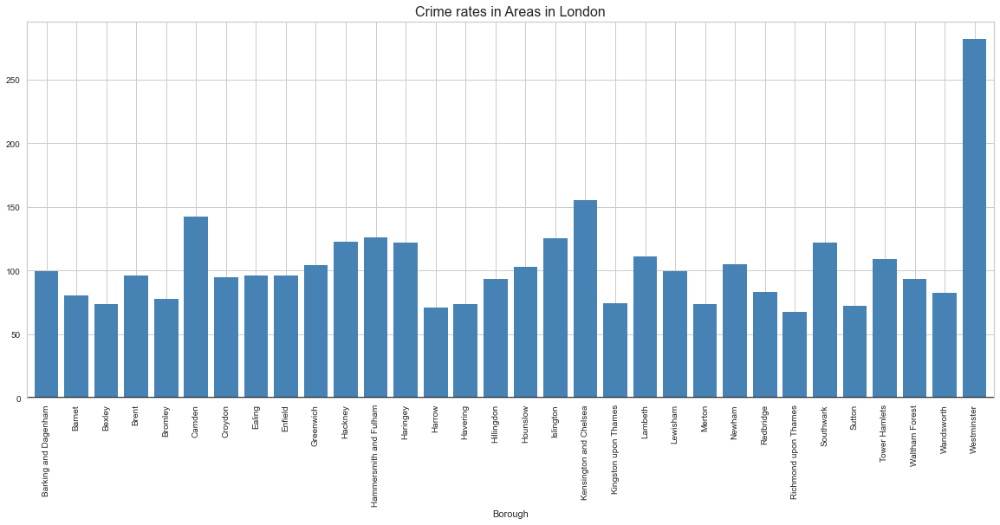

In [57]:
colors =['steelblue']
ax = crime_rate.plot(x='Borough', y='Crime rate', kind='bar', figsize=(20,8), width =0.8, color=colors)
ax.axhline(0, color='black') # draw the x axis line
ax.set_title("Crime rates in Areas in London", fontsize=16)

It appears Westminster has a very high crime rate

#### Bap plot showing crime counts in each London borough

In [58]:
crime_counts = london_data_comb.groupby('Borough')['Crime count'].mean()

Text(0.5, 1.0, 'Crime counts in Areas in London')

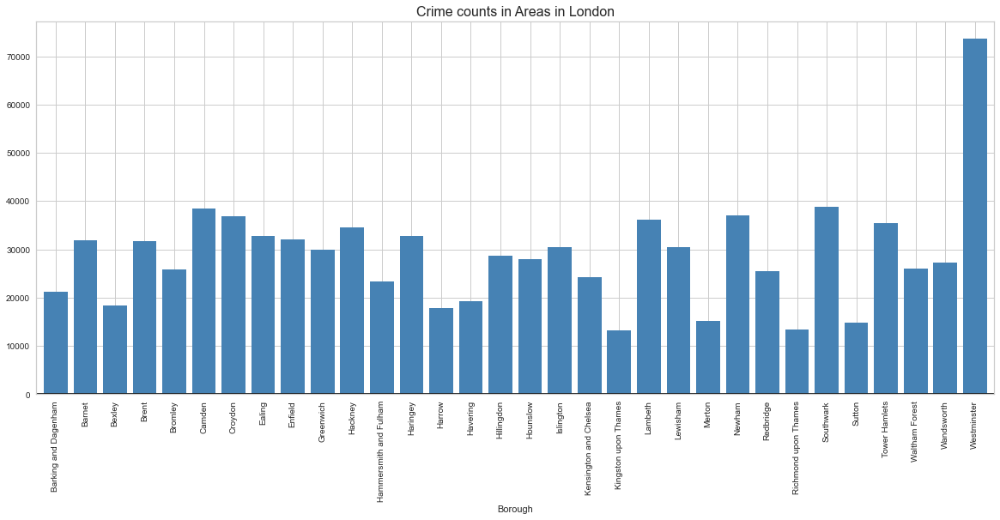

In [59]:
colors =['steelblue']
ax = crime_counts.plot(x='Borough', y='Crime count', kind='bar', figsize=(20,8), width =0.8, color=colors)
ax.axhline(0, color='black') # draw the x axis line
ax.set_title("Crime counts in Areas in London", fontsize=16)

In [60]:
pip install geojson

Note: you may need to restart the kernel to use updated packages.


#### Retrieve the coordinates for each Borough from the geojson file
This will be used to visualize a choropleth map showing the crime rates in London

In [61]:
import geojson
coordinates_json = 'https://skgrange.github.io/www/data/london_boroughs.json'
london_json = requests.get(coordinates_json).json()


#### Crime rate data on a choropleth map

In [63]:
london_crime = folium.Map(location=[latitude, longitude], zoom_start=10, 
                         min_zoom=9, max_zoom=11)
london_crime.choropleth(
    geo_data=london_json,
    data=london_data_comb,
    columns=['Neighbourhood', 'Crime rate'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Crime rates in London for 2020'
)
london_crime

#### Bar plot showing price per square feet in London

(array([ 6.,  0.,  6.,  8., 11.,  4.,  4., 10., 17., 14., 16., 17.,  4.,
        21., 12.,  8.,  7.,  9.,  8.,  8.,  6., 12., 15.,  8., 15.,  5.,
         8.,  4.,  0.,  5.,  8.,  7.,  1.,  4.,  2.,  2.,  4.,  3., 13.,
        13.,  3.,  2.,  0.,  3.,  0.,  5.,  0.,  6., 14.,  0.,  0.,  0.,
         1.,  3.,  4.,  2.,  0.,  0.,  0.,  0.,  8.,  0.,  0.,  3.,  0.,
         9.,  0.,  0.,  0.,  0.,  1.,  4.,  0.,  4.,  1.,  6.,  0.,  0.,
         0.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  5.,  0.,
         0.,  0.,  0.,  2.,  1.,  0.,  0.,  1.,  1.]),
 array([ 344.  ,  353.35,  362.7 ,  372.05,  381.4 ,  390.75,  400.1 ,
         409.45,  418.8 ,  428.15,  437.5 ,  446.85,  456.2 ,  465.55,
         474.9 ,  484.25,  493.6 ,  502.95,  512.3 ,  521.65,  531.  ,
         540.35,  549.7 ,  559.05,  568.4 ,  577.75,  587.1 ,  596.45,
         605.8 ,  615.15,  624.5 ,  633.85,  643.2 ,  652.55,  661.9 ,
         671.25,  680.6 ,  689.95,  699.3 ,  708.65,  718.  ,  727.35,
        

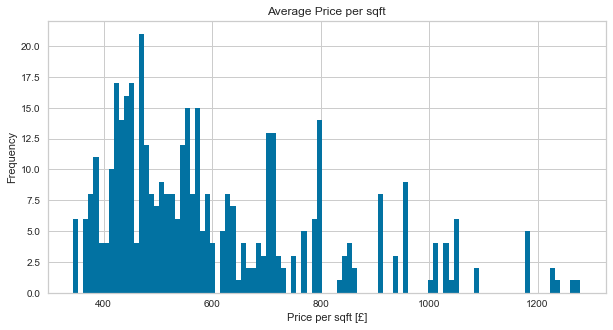

In [64]:
plt.figure(figsize = [10, 5]) # larger figure size for subplots

plt.ylabel('Frequency')
plt.xlabel('Price per sqft [£]')
plt.title('Average Price per sqft')
ax.grid()
#plt.subplot(1, 2, 2) # 1 row, 2 cols, subplot 2
bin_edges = 100
plt.hist(data = london_data_comb, x = '£/sqft', bins = bin_edges)


Thera are more neighbourhoods with price per square feet between £300 and £600

#### Group the price per sqft into three categories; low £/sqft, medium £/sqft and high £/sqft

In [65]:
bins = np.linspace(min(london_borough_price["£/sqft"]), max(london_borough_price["£/sqft"]), 4)
#Create bin names
group_names = ["Low £/sqft", "Medium £/sqft", "High £/sqft"]
#Use the pandas function .cut() to segment and sort values into bins
london_data_comb["price_binned"] = pd.cut(london_borough_price["£/sqft"], bins, labels=group_names, include_lowest=True)
london_data_comb.head()

,Neighbourhood,Borough,Area,Crime count,Crime rate,Avg price,£/sqft,Latitude,Longitude,price_binned
0,Addington,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft
1,Addiscombe,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft
2,Coombe,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft
3,Coulsdon,Croydon,CR5,36790,95.1,530180.0,437.0,51.405360,-0.065540,Low £/sqft
4,Croydon,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft


In [66]:
london_price_map = folium.Map(location=[latitude, longitude], zoom_start=10, 
                         min_zoom=9, max_zoom=11)

for lat, lng, borough, neighbourhood, price in zip(london_data_comb['Latitude'], 
                                           london_data_comb['Longitude'], 
                                           london_data_comb['Borough'], 
                                           london_data_comb['Neighbourhood'],
                                           london_data_comb['price_binned']):
    if price == "Low £/sqft":
        label = folium.Popup(str(neighbourhood + ", "+borough+": " + price), parse_html=True)
        folium.CircleMarker([lat, lng], radius=6, popup=label, color='green',fill=True,fill_color='#008000',fill_opacity=2.0,parse_html=False).add_to(london_price_map)
    
    elif price == "Medium £/sqft":
        label = folium.Popup(str(neighbourhood + ", "+borough+": " + price), parse_html=True)
        folium.CircleMarker([lat, lng], radius=5, popup=label, color='orange',fill=True,fill_color='#FF8C00',fill_opacity=2.0,parse_html=False).add_to(london_price_map)
    
    elif price == "High £/sqft":
        label = folium.Popup(str(neighbourhood + ", "+borough+": " + price), parse_html=True)
        folium.CircleMarker([lat, lng], radius=5, popup=label, color='red',fill=True,fill_color='#FF6347',fill_opacity=2.0,parse_html=False).add_to(london_price_map)
        
london_price_map

Map of London with each marker representing a neighbourhood and the colours green, yellow, and red representing low £/sqft, medium £/sqft and high £/sqft respectively. 

### Retrieve London venue data using Foursquare api

#### Define Foursquare credentials

In [67]:
CLIENT_ID = '#############Q5W5K2S0F454PDOUJKKNQ' # your Foursquare ID
CLIENT_SECRET = '##################5EPONY055D10TCBZFRFCWQY' # your Foursquare Secret
VERSION = '20180605'
LIMIT = 500
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: QWVYMGEAHZQLKXM53S5DH2PCCC4Q5W5K2S0F454PDOUJKKNQ
CLIENT_SECRET:51QN53KURM5MUAV2THHDA1LDP5EPONY055D10TCBZFRFCWQY


#### Create a function to get venue categories

This function returns the name of the venue, the venue category, and the venue coordinates

In [68]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighbourhood', 
                  'Neighbourhood Latitude', 
                  'Neighbourhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

#### Retrieve venue categories for neighbourhoods in London and store in a dataframe
This dataframe will be called london_venues

In [69]:
london_venues = getNearbyVenues(names=london_data_comb['Neighbourhood'],
                                   latitudes=london_data_comb['Latitude'],
                                   longitudes=london_data_comb['Longitude']
                                   )

Addington
Addiscombe
Coombe
Coulsdon
Croydon
Forestdale
Kenley
New Addington
Norbury
Old Coulsdon
Purley
Riddlesdown
Sanderstead
Selhurst
Selsdon
Shirley
South Croydon
South Norwood
Thornton Heath
Upper Norwood
Waddon
Woodside
Barnehurst
Barnes Cray
Belvedere
Bexley (also Old Bexley, Bexley Village)
Blackfen
Colyers
Crayford
Crook Log
Crossness
East Wickham
Foots Cray
Lamorbey
Lessness Heath
North Cray
North End
Northumberland Heath
Slade Green
Upton
Welling
West Heath
Aldborough Hatch
Barkingside
Gants Hill
Goodmayes
Hainault
Ilford
Loxford
Newbury Park
Redbridge
Seven Kings
South Woodford
Wanstead
Aldwych
Bayswater
Belgravia
Charing Cross
Chinatown
Covent Garden
Knightsbridge
Lisson Grove
Maida Vale
Marylebone (also St Marylebone)
Mayfair
Millbank
Paddington
Pimlico
Soho
St James's
St John's Wood
Westminster
Alperton
Brent Park
Brondesbury
Church End
Dollis Hill
Harlesden
Kingsbury
Preston
Queen's Park
Stonebridge
Tokyngton
Wembley Park
Willesden
Anerley
Aperfield
Bickley
Biggin Hill

#### View the new dataframe

In [70]:
london_venues.head()

,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Addington,51.381893,-0.106196,TFC - Turkish Food Centre,51.379766,-0.104413,Grocery Store
1,Addington,51.381893,-0.106196,Matthews Yard,51.378142,-0.102519,Coffee Shop
2,Addington,51.381893,-0.106196,Kaspa's,51.378081,-0.102652,Dessert Shop
3,Addington,51.381893,-0.106196,Chennai Dosa,51.383363,-0.107946,Dosa Place
4,Addington,51.381893,-0.106196,Lidl,51.380123,-0.104804,Supermarket


#### The size of the dataframe

In [71]:
london_venues.shape

(12709, 7)

#### The description of the dataframe

In [72]:
london_venues.describe(include='all')

,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
count,12709,12709.000000,12709.000000,12709,12709.000000,12709.000000,12709
unique,411,NaN,NaN,1671,NaN,NaN,266
top,Camberwell,NaN,NaN,Tesco Express,NaN,NaN,Pub
freq,100,NaN,NaN,110,NaN,NaN,1080
mean,NaN,51.515786,-0.110048,NaN,51.515945,-0.110417,NaN
std,NaN,0.045082,0.079794,NaN,0.045237,0.079898,NaN
min,NaN,51.381893,-0.412877,NaN,51.378081,-0.417021,NaN
25%,NaN,51.493640,-0.144260,NaN,51.492860,-0.139392,NaN
50%,NaN,51.526299,-0.089190,NaN,51.523927,-0.091551,NaN
75%,NaN,51.540730,-0.066647,NaN,51.540306,-0.066160,NaN


The dataframe has 12709 rows

In [73]:
print('There are {} uniques categories.'.format(len(london_venues['Venue Category'].unique())))

There are 266 uniques categories.


### Onehot encoding

We will covert the categorical variables into numerical variables so that we can build our model. Converting the variables will make the K Means algorithm do a better job at prediction
The new dataframe will be called london_onehot

In [74]:
# Onehot encoding
london_onehot = pd.get_dummies(london_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighbourhood column back to dataframe
london_onehot['Neighbourhood'] = london_venues['Neighbourhood'] 

# move neighbourhood column to the first column
fixed_columns = [london_onehot.columns[-1]] + list(london_onehot.columns[:-1])
london_onehot = london_onehot[fixed_columns]

london_onehot.head()

,Neighbourhood,Adult Boutique,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,...,Video Game Store,Vietnamese Restaurant,Warehouse Store,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Addington,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Addington,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Addington,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Addington,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Addington,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


#### Size of the dataframe

In [75]:
london_onehot.shape

(12709, 267)

#### Group rows by neighbourhood and find the mean of the frequency of occurrence of each category
This will be stored in 'london_grouped' dataframe

In [76]:
london_grouped = london_onehot.groupby('Neighbourhood').mean().reset_index()
london_grouped.head()

,Neighbourhood,Adult Boutique,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,...,Video Game Store,Vietnamese Restaurant,Warehouse Store,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Addington,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Addiscombe,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Aldborough Hatch,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.055556,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Aldwych,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Alperton,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


#### Retrieve the top 10 venue category in each neighbourhood

In [77]:
num_top_venues = 10

for hood in london_grouped['Neighbourhood']:
    print("----"+hood+"----")
    temp = london_grouped[london_grouped['Neighbourhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Addington----
                  venue  freq
0              Platform  0.14
1           Pizza Place  0.14
2          Dessert Shop  0.07
3           Coffee Shop  0.07
4              Bus Stop  0.07
5           Supermarket  0.07
6         Grocery Store  0.07
7  Fast Food Restaurant  0.07
8                Bakery  0.07
9           Bus Station  0.07


----Addiscombe----
                  venue  freq
0              Platform  0.14
1           Pizza Place  0.14
2          Dessert Shop  0.07
3           Coffee Shop  0.07
4              Bus Stop  0.07
5           Supermarket  0.07
6         Grocery Store  0.07
7  Fast Food Restaurant  0.07
8                Bakery  0.07
9           Bus Station  0.07


----Aldborough Hatch----
               venue  freq
0               Park  0.11
1           Bus Stop  0.11
2      Grocery Store  0.11
3        Coffee Shop  0.06
4   Asian Restaurant  0.06
5  Convenience Store  0.06
6                Bar  0.06
7            Theater  0.06
8              Hotel  0.06
9   

#### Create a function to sort the top ten most common venues in descending order

In [78]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

#### Create a new dataframe that contains each London neighbourhood and their corresponding most common venues

In [79]:
indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighbourhood']

#Append ordinals
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
london_venues_sorted = pd.DataFrame(columns=columns)
london_venues_sorted['Neighbourhood'] = london_grouped['Neighbourhood']

for ind in np.arange(london_grouped.shape[0]):
    london_venues_sorted.iloc[ind, 1:] = return_most_common_venues(london_grouped.iloc[ind, :], num_top_venues)

london_venues_sorted.head()

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Addington,Platform,Pizza Place,Dessert Shop,Bakery,Grocery Store,Dosa Place,Supermarket,Coffee Shop,Fast Food Restaurant,Pub
1,Addiscombe,Platform,Pizza Place,Dessert Shop,Bakery,Grocery Store,Dosa Place,Supermarket,Coffee Shop,Fast Food Restaurant,Pub
2,Aldborough Hatch,Grocery Store,Park,Bus Stop,Theater,Asian Restaurant,Café,Gay Bar,Chinese Restaurant,Indian Restaurant,Bar
3,Aldwych,Park,Pub,Athletics & Sports,Yoga Studio,Farmers Market,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Fast Food Restaurant
4,Alperton,Park,Hotel,Pizza Place,Bus Stop,Bagel Shop,Farmers Market,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm


### Model deployment

As stated earlier, K Means clustering algorithm will be used to cluster each neighbourhood

#### Create a new dataframe called 'london_grouped_clustering' by dropping the 'Neighbourhood' column
We are left with numerical data that will be used for clustering.
A model called KElbowVisualizer will be used to predict the optimum value for k (i.e. the number of clusters).

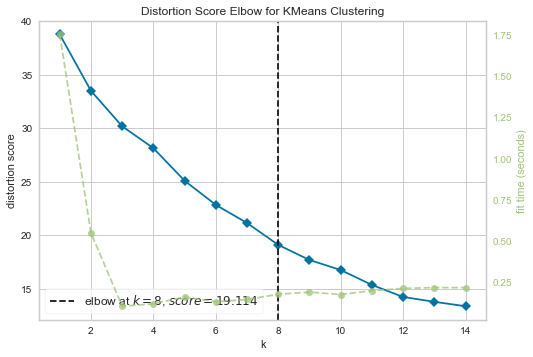

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [80]:
london_grouped_clustering = london_grouped.drop(['Neighbourhood'], 1)


kmeans = KMeans()

visualizer = KElbowVisualizer(kmeans, k = (1,15))
visualizer.fit(london_grouped_clustering)
visualizer.show()

The data will be divided into 8 lusters

In [81]:
kclusters = 8


# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(london_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([3, 3, 3, 7, 3, 5, 5, 3, 3, 3])

#### Create new dataframe that has column containing the cluster label for each neighbourhood
The new dataframe will be named 'london_merged'.

In [82]:
london_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

london_merged = london_data_comb
london_merged = london_merged.join(london_venues_sorted.set_index('Neighbourhood'), on='Neighbourhood')
london_merged.head()

,Neighbourhood,Borough,Area,Crime count,Crime rate,Avg price,£/sqft,Latitude,Longitude,price_binned,...,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Addington,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Platform,Pizza Place,Dessert Shop,Bakery,Grocery Store,Dosa Place,Supermarket,Coffee Shop,Fast Food Restaurant,Pub
1,Addiscombe,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Platform,Pizza Place,Dessert Shop,Bakery,Grocery Store,Dosa Place,Supermarket,Coffee Shop,Fast Food Restaurant,Pub
2,Coombe,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Pub,Café,Pizza Place,Italian Restaurant,Supermarket,Indian Restaurant,Platform,Food,Fast Food Restaurant,Bakery
3,Coulsdon,Croydon,CR5,36790,95.1,530180.0,437.0,51.405360,-0.065540,Low £/sqft,...,Grocery Store,Café,Park,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,English Restaurant
4,Croydon,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Platform,Pizza Place,Dessert Shop,Bakery,Grocery Store,Dosa Place,Supermarket,Coffee Shop,Fast Food Restaurant,Pub


#### Drop Nan values 

In [83]:
london_merged.dropna(subset=['Cluster Labels'], inplace = True)
london_merged.head()

,Neighbourhood,Borough,Area,Crime count,Crime rate,Avg price,£/sqft,Latitude,Longitude,price_binned,...,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Addington,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Platform,Pizza Place,Dessert Shop,Bakery,Grocery Store,Dosa Place,Supermarket,Coffee Shop,Fast Food Restaurant,Pub
1,Addiscombe,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Platform,Pizza Place,Dessert Shop,Bakery,Grocery Store,Dosa Place,Supermarket,Coffee Shop,Fast Food Restaurant,Pub
2,Coombe,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Pub,Café,Pizza Place,Italian Restaurant,Supermarket,Indian Restaurant,Platform,Food,Fast Food Restaurant,Bakery
3,Coulsdon,Croydon,CR5,36790,95.1,530180.0,437.0,51.405360,-0.065540,Low £/sqft,...,Grocery Store,Café,Park,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,English Restaurant
4,Croydon,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Platform,Pizza Place,Dessert Shop,Bakery,Grocery Store,Dosa Place,Supermarket,Coffee Shop,Fast Food Restaurant,Pub


#### Convert the 'Cluster Label' column to int64 data type

In [84]:
london_merged['Cluster Labels'] = london_merged['Cluster Labels'].astype('int64')
london_merged

,Neighbourhood,Borough,Area,Crime count,Crime rate,Avg price,£/sqft,Latitude,Longitude,price_binned,...,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Addington,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Platform,Pizza Place,Dessert Shop,Bakery,Grocery Store,Dosa Place,Supermarket,Coffee Shop,Fast Food Restaurant,Pub
1,Addiscombe,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Platform,Pizza Place,Dessert Shop,Bakery,Grocery Store,Dosa Place,Supermarket,Coffee Shop,Fast Food Restaurant,Pub
2,Coombe,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Pub,Café,Pizza Place,Italian Restaurant,Supermarket,Indian Restaurant,Platform,Food,Fast Food Restaurant,Bakery
3,Coulsdon,Croydon,CR5,36790,95.1,530180.0,437.0,51.405360,-0.065540,Low £/sqft,...,Grocery Store,Café,Park,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,English Restaurant
4,Croydon,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Platform,Pizza Place,Dessert Shop,Bakery,Grocery Store,Dosa Place,Supermarket,Coffee Shop,Fast Food Restaurant,Pub
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
411,Sands End,Hammersmith and Fulham,SW6,23360,126.2,879138.0,953.0,51.482600,-0.212880,Medium £/sqft,...,Café,Park,Gym / Fitness Center,Pub,Grocery Store,Pizza Place,Breakfast Spot,Garden,Thai Restaurant,Bus Stop
412,Shepherd's Bush,Hammersmith and Fulham,W12,23360,126.2,687072.0,785.0,51.482600,-0.212880,Medium £/sqft,...,Café,Park,Gym / Fitness Center,Pub,Grocery Store,Pizza Place,Breakfast Spot,Garden,Thai Restaurant,Bus Stop
413,West Kensington,Hammersmith and Fulham,W14,23360,126.2,833058.0,1003.0,51.482600,-0.212880,Low £/sqft,...,Café,Park,Gym / Fitness Center,Pub,Grocery Store,Pizza Place,Breakfast Spot,Garden,Thai Restaurant,Bus Stop
414,White City,Hammersmith and Fulham,W12,23360,126.2,687072.0,785.0,51.482600,-0.212880,Low £/sqft,...,Café,Park,Gym / Fitness Center,Pub,Grocery Store,Pizza Place,Breakfast Spot,Garden,Thai Restaurant,Bus Stop


#### Visualize the clusters

In [188]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
#x = np.arange(kclusters)
#ys = [i + x + (i*x)**2 for i in range(kclusters)]
#colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
#rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi,borough, cluster in zip(london_merged['Latitude'], 
                                  london_merged['Longitude'], 
                                  london_merged['Neighbourhood'],
                                  london_merged['Borough'], 
                                  london_merged['Cluster Labels']):
    if cluster == 0:
        label = folium.Popup(str(poi) +', '+str(borough)+'; '+ ' Cluster ' + str(cluster), parse_html=True)
        folium.CircleMarker([lat, lon], radius=6, popup=label, color='green',fill=True,fill_color='green',fill_opacity=2.0,parse_html=False).add_to(map_clusters)
    
    elif cluster == 1:
        label = folium.Popup(str(poi) +', '+str(borough)+'; '+ ' Cluster ' + str(cluster), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='blue',fill=True,fill_color='blue',fill_opacity=2.0,parse_html=False).add_to(map_clusters)
    elif cluster == 2:
        label = folium.Popup(str(poi) +', '+str(borough)+'; '+ ' Cluster ' + str(cluster), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='purple',fill=True,fill_color='purple',fill_opacity=2.0,parse_html=False).add_to(map_clusters)
    elif cluster == 3:
        label = folium.Popup(str(poi) +', '+str(borough)+'; '+ ' Cluster ' + str(cluster), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='red',fill=True,fill_color='red',fill_opacity=2.0,parse_html=False).add_to(map_clusters)
    elif cluster == 4:
        label = folium.Popup(str(poi) +', '+str(borough)+'; '+ ' Cluster ' + str(cluster), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='orange',fill=True,fill_color='orange',fill_opacity=2.0,parse_html=False).add_to(map_clusters)
    elif cluster == 5:
        label = folium.Popup(str(poi) +', '+str(borough)+'; '+ ' Cluster ' + str(cluster), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='brown',fill=True,fill_color='brown',fill_opacity=2.0,parse_html=False).add_to(map_clusters)
    elif cluster == 6:
        label = folium.Popup(str(poi) +', '+str(borough)+'; '+ ' Cluster ' + str(cluster), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='pink',fill=True,fill_color='pink',fill_opacity=2.0,parse_html=False).add_to(map_clusters)
    elif cluster == 7:
        label = folium.Popup(str(poi) +', '+str(borough)+'; '+ ' Cluster ' + str(cluster), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='yellow',fill=True,fill_color='yellow',fill_opacity=2.0,parse_html=False).add_to(map_clusters)
    
map_clusters

Each marker represents a neighbourhood and different colours represents differnt clusters
Green: Cluster0 
Blue: Cluster1
Purple: Cluster2
Red: Cluster3
Orange: Cluster4
Brown: Cluster5
Pink: Cluster6
Yellow: Cluster7

## Results

### View and examine each cluster
Each cluster will be named from Cluster0 to Cluster7

#### Cluster 0

In [88]:
cluster0 = london_merged.loc[london_merged['Cluster Labels'] == 0]
cluster0.reset_index(drop=True,inplace=True)
cluster0

,Neighbourhood,Borough,Area,Crime count,Crime rate,Avg price,£/sqft,Latitude,Longitude,price_binned,...,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Barnehurst,Bexley,DA7,18323,73.8,445730.0,406.0,51.451113,0.064593,Low £/sqft,...,Mediterranean Restaurant,Dessert Shop,Pizza Place,Pub,Park,Italian Restaurant,Gym / Fitness Center,Farm,Ethiopian Restaurant,Event Space
1,Barnes Cray,Bexley,DA1,18323,73.8,307564.0,363.0,51.450560,0.064320,Low £/sqft,...,Mediterranean Restaurant,Dessert Shop,Supermarket,Pizza Place,Pub,Italian Restaurant,Gym / Fitness Center,Event Space,Falafel Restaurant,Farm
2,Belvedere,Bexley,DA17,18323,73.8,313878.0,351.0,51.451470,0.065490,Medium £/sqft,...,Dessert Shop,Pub,Park,Italian Restaurant,Fast Food Restaurant,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market
3,"Bexley (also Old Bexley, Bexley Village)",Bexley,DA5,18323,73.8,508967.0,428.0,51.451097,0.064533,Medium £/sqft,...,Mediterranean Restaurant,Dessert Shop,Pizza Place,Pub,Park,Italian Restaurant,Gym / Fitness Center,Farm,Ethiopian Restaurant,Event Space
4,Blackfen,Bexley,DA15,18323,73.8,427473.0,436.0,51.451360,0.065090,Low £/sqft,...,Italian Restaurant,Pub,Park,Mediterranean Restaurant,Dessert Shop,Fast Food Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market
5,Colyers,Bexley,DA8,18323,73.8,318433.0,344.0,51.450810,0.064550,Low £/sqft,...,Mediterranean Restaurant,Dessert Shop,Pizza Place,Pub,Gym / Fitness Center,Italian Restaurant,Farmers Market,Ethiopian Restaurant,Event Space,Falafel Restaurant
6,Crayford,Bexley,DA1,18323,73.8,307564.0,363.0,51.450560,0.064320,Medium £/sqft,...,Mediterranean Restaurant,Dessert Shop,Supermarket,Pizza Place,Pub,Italian Restaurant,Gym / Fitness Center,Event Space,Falafel Restaurant,Farm
7,Crook Log,Bexley,DA6,18323,73.8,380041.0,412.0,51.450810,0.064550,Medium £/sqft,...,Mediterranean Restaurant,Dessert Shop,Pizza Place,Pub,Gym / Fitness Center,Italian Restaurant,Farmers Market,Ethiopian Restaurant,Event Space,Falafel Restaurant
8,East Wickham,Bexley,DA16,18323,73.8,424367.0,402.0,51.450810,0.064550,Medium £/sqft,...,Mediterranean Restaurant,Dessert Shop,Pizza Place,Pub,Gym / Fitness Center,Italian Restaurant,Farmers Market,Ethiopian Restaurant,Event Space,Falafel Restaurant
9,Foots Cray,Bexley,DA14,18323,73.8,357403.0,437.0,51.450810,0.064550,Low £/sqft,...,Mediterranean Restaurant,Dessert Shop,Pizza Place,Pub,Gym / Fitness Center,Italian Restaurant,Farmers Market,Ethiopian Restaurant,Event Space,Falafel Restaurant


#### Boroughs in cluster 0

In [142]:
borough0 = cluster0.groupby('Borough')['Area', 'Neighbourhood'].agg(lambda x: x.to_list())
borough0 = pd.DataFrame(borough0)
borough0.columns = ['Areas in cluster0','Neighbourhoods in Cluster0']
borough0.head()

<ipython-input-142-322209c398d3>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  borough0 = cluster0.groupby('Borough')['Area', 'Neighbourhood'].agg(lambda x: x.to_list())


,Areas in cluster0,Neighbourhoods in Cluster0
Borough,,
Bexley,"[DA7, DA1, DA17, DA5, DA15, DA8, DA1, DA6, DA1...","[Barnehurst, Barnes Cray, Belvedere, Bexley (a..."


#### Neighbourhoods in cluster0

In [189]:
cluster0['Neighbourhood'].unique()

array(['Barnehurst', 'Barnes Cray', 'Belvedere',
       'Bexley (also Old Bexley, Bexley Village)', 'Blackfen', 'Colyers',
       'Crayford', 'Crook Log', 'East Wickham', 'Foots Cray', 'Lamorbey',
       'Lessness Heath', 'North Cray', 'North End',
       'Northumberland Heath', 'Slade Green', 'Upton', 'Welling'],
      dtype=object)

#### Number of venue categories

In [327]:
#a = cluster0['Neighbourhood'].isin(london_venues['Neighbourhood'])
a = london_venues.loc[london_venues['Neighbourhood'].isin(cluster0['Neighbourhood'])].groupby('Venue Category')['Neighbourhood'].size()
a = pd.DataFrame(a)
a.columns = ['Frequency']
a

,Frequency
Venue Category,
Dessert Shop,18
Gym / Fitness Center,14
Italian Restaurant,18
Mediterranean Restaurant,30
Park,6
Pizza Place,14
Pub,18
Supermarket,2


#### Bar plot showing frequency of each venue category

Text(0, 0.5, 'Number of occurence')

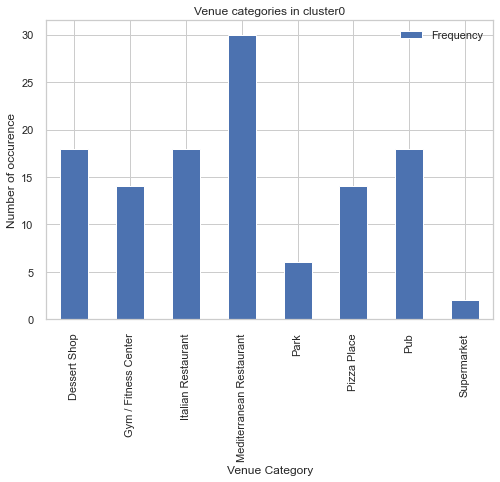

In [328]:
ax = a.plot(kind='bar')
ax.set_title('Venue categories in cluster0')
ax.set_xlabel('Venue Category')
ax.set_ylabel('Number of occurence')

### Cluster1

In [91]:
cluster1 = london_merged.loc[london_merged['Cluster Labels'] == 1]
cluster1.reset_index(drop=True,inplace=True)
cluster1

,Neighbourhood,Borough,Area,Crime count,Crime rate,Avg price,£/sqft,Latitude,Longitude,price_binned,...,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Childs Hill,Barnet,NW2,31911,80.6,530540.0,629.0,51.63568,-0.19847,Low £/sqft,...,Bus Stop,Yoga Studio,Escape Room,Food & Drink Shop,Food,Flower Shop,Flea Market,Fish Market,Fish & Chips Shop,Film Studio
1,East Finchley,Barnet,N2,31911,80.6,615603.0,550.0,51.63568,-0.19847,Low £/sqft,...,Bus Stop,Yoga Studio,Escape Room,Food & Drink Shop,Food,Flower Shop,Flea Market,Fish Market,Fish & Chips Shop,Film Studio
2,Hampstead Garden Suburb,Barnet,N2,31911,80.6,615603.0,550.0,51.63568,-0.19847,Low £/sqft,...,Bus Stop,Yoga Studio,Escape Room,Food & Drink Shop,Food,Flower Shop,Flea Market,Fish Market,Fish & Chips Shop,Film Studio


#### Boroughs in cluster1

In [141]:
borough1 = cluster1.groupby('Borough')['Area','Neighbourhood'].agg(lambda x: x.to_list())
borough1 = pd.DataFrame(borough1)
borough1.columns = ['Areas in Cluster1', 'Neighbourhoods in cluster1']
borough1

<ipython-input-141-3d78ea58e14c>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  borough1 = cluster1.groupby('Borough')['Area','Neighbourhood'].agg(lambda x: x.to_list())


,Areas in Cluster1,Neighbourhoods in cluster1
Borough,,
Barnet,"[NW2, N2, N2]","[Childs Hill, East Finchley, Hampstead Garden ..."


#### Neighbourhoods in cluster1

In [350]:
cluster1['Neighbourhood'].unique()

array(['Childs Hill', 'East Finchley', 'Hampstead Garden Suburb'],
      dtype=object)

#### Frequency of venue categories

In [330]:
b = london_venues.loc[london_venues['Neighbourhood'].isin(cluster1['Neighbourhood'])].groupby('Venue Category')['Neighbourhood'].size()
b = pd.DataFrame(b)
b.columns = ['Frequency']
b

,Frequency
Venue Category,
Bus Stop,3


Text(0, 0.5, 'Number of occurence')

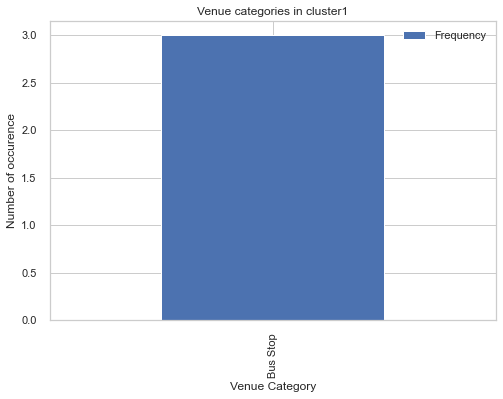

In [351]:
ax = b.plot(kind='bar')
ax.set_title('Venue categories in cluster1')
ax.set_xlabel('Venue Category')
ax.set_ylabel('Number of occurence')

### Cluster2

In [95]:
cluster2 = london_merged.loc[london_merged['Cluster Labels'] == 2]
cluster2.reset_index(drop=True,inplace=True)
cluster2

,Neighbourhood,Borough,Area,Crime count,Crime rate,Avg price,£/sqft,Latitude,Longitude,price_binned,...,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Canning Town,Newham,E16,37107,105.1,483098.0,555.0,51.41781,-0.25775,Low £/sqft,...,Nutritionist,Bakery,Golf Course,Yoga Studio,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Food Stand
1,Custom House,Newham,E16,37107,105.1,483098.0,555.0,51.41781,-0.25775,Low £/sqft,...,Nutritionist,Bakery,Golf Course,Yoga Studio,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Food Stand
2,East Ham,Newham,E6,37107,105.1,381311.0,417.0,51.41781,-0.25775,Low £/sqft,...,Nutritionist,Bakery,Golf Course,Yoga Studio,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Food Stand
3,Forest Gate,Newham,E7,37107,105.1,471401.0,471.0,51.41781,-0.25775,Low £/sqft,...,Nutritionist,Bakery,Golf Course,Yoga Studio,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Food Stand
4,Little Ilford,Newham,E12,37107,105.1,417461.0,410.0,51.41781,-0.25775,Low £/sqft,...,Nutritionist,Bakery,Golf Course,Yoga Studio,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Food Stand
5,Manor Park,Newham,E12,37107,105.1,417461.0,410.0,51.41781,-0.25775,Medium £/sqft,...,Nutritionist,Bakery,Golf Course,Yoga Studio,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Food Stand
6,Maryland,Newham,E15,37107,105.1,433181.0,543.0,51.41781,-0.25775,Medium £/sqft,...,Nutritionist,Bakery,Golf Course,Yoga Studio,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Food Stand
7,North Woolwich,Newham,E16,37107,105.1,483098.0,555.0,51.41781,-0.25775,Medium £/sqft,...,Nutritionist,Bakery,Golf Course,Yoga Studio,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Food Stand
8,Silvertown,Newham,E16,37107,105.1,483098.0,555.0,51.41781,-0.25775,Low £/sqft,...,Nutritionist,Bakery,Golf Course,Yoga Studio,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Food Stand
9,Stratford,Newham,E15,37107,105.1,433181.0,543.0,51.41781,-0.25775,Medium £/sqft,...,Nutritionist,Bakery,Golf Course,Yoga Studio,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Food Stand


#### Boroughs in cluster2

In [143]:
borough2 = cluster2.groupby('Borough')['Area', 'Neighbourhood'].agg(lambda x: x.to_list())
borough2 = pd.DataFrame(borough2)
borough2.columns = ['Areas in Cluster2', 'Neighbourhoods in cluster2']
borough2

<ipython-input-143-d7d5f15a882c>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  borough2 = cluster2.groupby('Borough')['Area', 'Neighbourhood'].agg(lambda x: x.to_list())


,Areas in Cluster2,Neighbourhoods in cluster2
Borough,,
Newham,"[E16, E16, E6, E7, E12, E12, E15, E16, E16, E15]","[Canning Town, Custom House, East Ham, Forest ..."


#### Neighbourhoods in cluster2

In [352]:
cluster2['Neighbourhood'].unique()

array(['Canning Town', 'Custom House', 'East Ham', 'Forest Gate',
       'Little Ilford', 'Manor Park', 'Maryland', 'North Woolwich',
       'Silvertown', 'Stratford'], dtype=object)

#### Number of venue categories in cluster2

In [333]:
c = london_venues.loc[london_venues['Neighbourhood'].isin(cluster2['Neighbourhood'])].groupby('Venue Category')['Neighbourhood'].size()
c = pd.DataFrame(c)
c.columns = ['Frequency']
c

,Frequency
Venue Category,
Bakery,10
Golf Course,10
Nutritionist,10


Text(0, 0.5, 'Number of occurence')

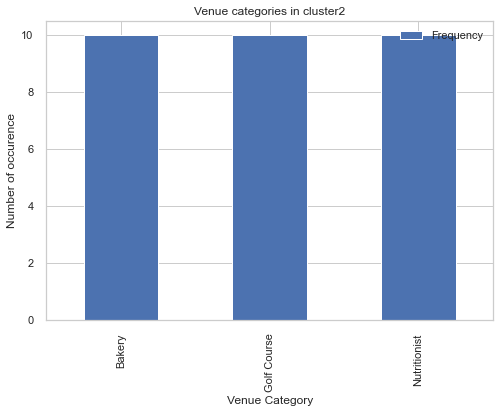

In [380]:
ax = c.plot(kind='bar')
ax.set_title('Venue categories in cluster2')
ax.set_xlabel('Venue Category')
ax.set_ylabel('Number of occurence')

Bar plot

### Cluster3

In [98]:
cluster3 = london_merged.loc[london_merged['Cluster Labels'] == 3]
cluster3.reset_index(drop=True,inplace=True)
cluster3

,Neighbourhood,Borough,Area,Crime count,Crime rate,Avg price,£/sqft,Latitude,Longitude,price_binned,...,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Addington,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Platform,Pizza Place,Dessert Shop,Bakery,Grocery Store,Dosa Place,Supermarket,Coffee Shop,Fast Food Restaurant,Pub
1,Addiscombe,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Platform,Pizza Place,Dessert Shop,Bakery,Grocery Store,Dosa Place,Supermarket,Coffee Shop,Fast Food Restaurant,Pub
2,Coombe,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Pub,Café,Pizza Place,Italian Restaurant,Supermarket,Indian Restaurant,Platform,Food,Fast Food Restaurant,Bakery
3,Croydon,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Platform,Pizza Place,Dessert Shop,Bakery,Grocery Store,Dosa Place,Supermarket,Coffee Shop,Fast Food Restaurant,Pub
4,Forestdale,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Platform,Pizza Place,Dessert Shop,Bakery,Grocery Store,Dosa Place,Supermarket,Coffee Shop,Fast Food Restaurant,Pub
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
289,Shoreditch,Hackney,N1,34510,122.8,712517.0,907.0,51.545050,-0.055320,Low £/sqft,...,Pub,Coffee Shop,Café,Cocktail Bar,Bakery,Brewery,Vietnamese Restaurant,Vegetarian / Vegan Restaurant,Grocery Store,Modern European Restaurant
290,South Hackney,Hackney,E9,34510,122.8,529471.0,640.0,51.545050,-0.055320,Low £/sqft,...,Pub,Coffee Shop,Café,Cocktail Bar,Bakery,Brewery,Vietnamese Restaurant,Vegetarian / Vegan Restaurant,Grocery Store,Modern European Restaurant
291,Stoke Newington,Hackney,N16,34510,122.8,537188.0,709.0,51.545050,-0.055320,Low £/sqft,...,Pub,Coffee Shop,Café,Cocktail Bar,Bakery,Brewery,Vietnamese Restaurant,Vegetarian / Vegan Restaurant,Grocery Store,Modern European Restaurant
292,Upper Clapton,Hackney,E5,34510,122.8,549104.0,660.0,51.545050,-0.055320,Low £/sqft,...,Pub,Coffee Shop,Café,Cocktail Bar,Bakery,Brewery,Vietnamese Restaurant,Vegetarian / Vegan Restaurant,Grocery Store,Modern European Restaurant


#### Boroughs in cluster3

In [146]:
borough3 = cluster3.groupby('Borough')['Area', 'Neighbourhood'].agg(lambda x: x.to_list())
borough3 = pd.DataFrame(borough3)
borough3.columns = ['Areas in cluster3', 'Neighbourhoods in cluster3']
borough3

<ipython-input-146-8a369f4d8cb8>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  borough3 = cluster3.groupby('Borough')['Area', 'Neighbourhood'].agg(lambda x: x.to_list())


,Areas in cluster3,Neighbourhoods in cluster3
Borough,,
Barking and Dagenham,"[IG11, RM9, RM8, RM9, IG11, RM6]","[Barking, Becontree, Becontree Heath, Castle G..."
Barnet,"[EN5, N11, HA8, NW4, N3, NW9, EN4, HA8, N11, N...","[Barnet (also Chipping Barnet, High Barnet), B..."
Bexley,"[SE2, SE2]","[Crossness, West Heath]"
Brent,"[HA0, NW10, NW6, NW10, NW2, NW10, NW6, NW10, N...","[Alperton, Brent Park, Brondesbury, Church End..."
Bromley,"[BR1, BR1, BR1, BR1]","[Bromley, Plaistow, Sundridge, Widmore (also W..."
Camden,"[NW3, WC1, NW1, NW1, W1, NW3, NW3, N6, NW5, NW...","[Belsize Park, Bloomsbury, Camden Town, Chalk ..."
Croydon,"[CR0, CR0, CR0, CR0, CR0, CR0, SW16, CR0, CR7,...","[Addington, Addiscombe, Coombe, Croydon, Fores..."
Ealing,"[W4, UB6, W7, UB5, UB2, UB6, W13]","[Bedford Park, Greenford, Hanwell, Northolt, N..."
Enfield,"[EN2, EN3, EN2, EN3, EN3, EN3, EN3, N21, EN4, ...","[Botany Bay, Brimsdown, Crews Hill, Enfield Hi..."


In [353]:
cluster3['Borough'].unique()

array(['Croydon', 'Bexley', 'Redbridge', 'Westminster', 'Brent',
       'Bromley', 'Islington', 'Havering', 'Barnet', 'Enfield',
       'Wandsworth', 'Southwark', 'Barking and Dagenham',
       'Richmond upon Thames', 'Newham', 'Sutton', 'Ealing', 'Lewisham',
       'Harrow', 'Camden', 'Kingston upon Thames', 'Tower Hamlets',
       'Greenwich', 'Haringey', 'Hounslow', 'Lambeth',
       'Kensington and Chelsea', 'Merton', 'Hackney'], dtype=object)

#### Most common venues in cluster3

Text(0, 0.5, 'Clusters')

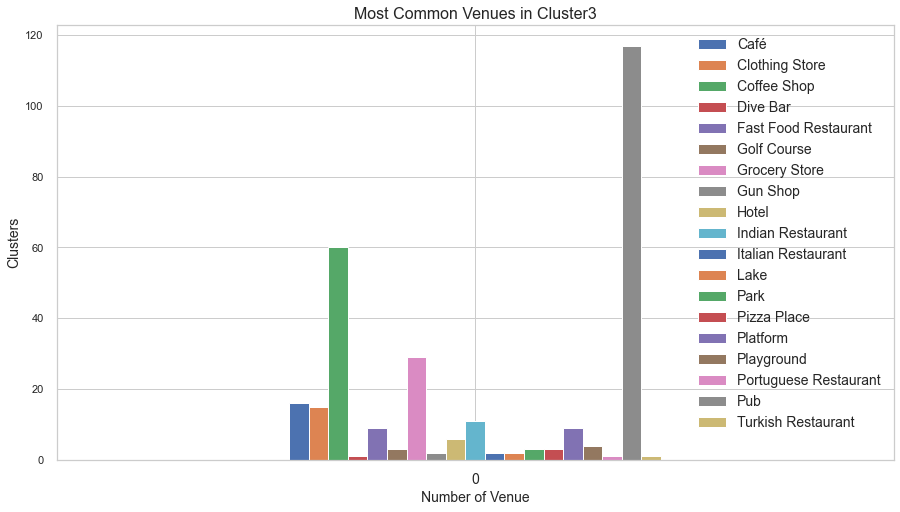

In [259]:
count_venue3 = cluster3
count_venue3 = count_venue3.drop(['Neighbourhood', 'Borough','Area', 'Latitude', 'Longitude'], axis=1)
count_venue3 = count_venue3.groupby(['Cluster Labels','1st Most Common Venue']).size().reset_index(name='Counts')

#we can transpose it to plot bar chart
cv_cluster3 = count_venue3.pivot(index='Cluster Labels', columns='1st Most Common Venue', values='Counts')
cv_cluster3 = cv_cluster3.fillna(0).astype(int).reset_index(drop=True)

#creating a bar chart of "Number of Venues in Each Cluster"
frame=cv_cluster3.plot(kind='bar',figsize=(15,8),width = 0.4)

plt.legend(labels=cv_cluster3.columns,fontsize= 14)
plt.title("Most Common Venues in Cluster3",fontsize= 16)
plt.xticks(fontsize=14)
plt.xticks(rotation=0)
plt.xlabel('Number of Venue', fontsize=14)
plt.ylabel('Clusters', fontsize=14)

### Cluster4

In [101]:
cluster4 = london_merged.loc[london_merged['Cluster Labels'] == 4]
cluster4.reset_index(drop=True,inplace=True)
cluster4

,Neighbourhood,Borough,Area,Crime count,Crime rate,Avg price,£/sqft,Latitude,Longitude,price_binned,...,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Coulsdon,Croydon,CR5,36790,95.1,530180.0,437.0,51.405360,-0.065540,Low £/sqft,...,Grocery Store,Café,Park,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,English Restaurant
1,Kenley,Croydon,CR8,36790,95.1,443532.0,416.0,51.405260,-0.065720,Low £/sqft,...,Grocery Store,Café,Park,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,English Restaurant
2,Old Coulsdon,Croydon,CR5,36790,95.1,530180.0,437.0,51.405360,-0.065540,Low £/sqft,...,Grocery Store,Café,Park,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,English Restaurant
3,Purley,Croydon,CR8,36790,95.1,443532.0,416.0,51.405260,-0.065720,Low £/sqft,...,Grocery Store,Café,Park,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,English Restaurant
4,Riddlesdown,Croydon,CR8,36790,95.1,443532.0,416.0,51.405260,-0.065720,Low £/sqft,...,Grocery Store,Café,Park,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,English Restaurant
5,Sanderstead,Croydon,CR2,36790,95.1,380293.0,442.0,51.405460,-0.065350,Low £/sqft,...,Grocery Store,Café,Park,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,English Restaurant
6,Selhurst,Croydon,SE25,36790,95.1,351493.0,445.0,51.593480,-0.083420,Low £/sqft,...,Playground,Fast Food Restaurant,Chinese Restaurant,Park,Café,Fish Market,Fish & Chips Shop,Film Studio,Flea Market,English Restaurant
7,Selsdon,Croydon,CR2,36790,95.1,380293.0,442.0,51.405460,-0.065350,Low £/sqft,...,Grocery Store,Café,Park,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,English Restaurant
8,South Croydon,Croydon,CR2,36790,95.1,380293.0,442.0,51.405460,-0.065350,High £/sqft,...,Grocery Store,Café,Park,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,English Restaurant
9,South Norwood,Croydon,SE25,36790,95.1,351493.0,445.0,51.593480,-0.083420,High £/sqft,...,Playground,Fast Food Restaurant,Chinese Restaurant,Park,Café,Fish Market,Fish & Chips Shop,Film Studio,Flea Market,English Restaurant


#### Boroughs and neighbourhoods in cluster4

In [149]:
borough4 = cluster4.groupby('Borough')['Area', 'Neighbourhood'].agg(lambda x: x.to_list())
borough4 = pd.DataFrame(borough4)
borough4.columns = ['Areas in cluster4','Neighbourhoods in cluster4']
borough4

<ipython-input-149-6bcdcca3a7b1>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  borough4 = cluster4.groupby('Borough')['Area', 'Neighbourhood'].agg(lambda x: x.to_list())


,Areas in cluster4,Neighbourhoods in cluster4
Borough,,
Croydon,"[CR5, CR8, CR5, CR8, CR8, CR2, SE25, CR2, CR2,...","[Coulsdon, Kenley, Old Coulsdon, Purley, Riddl..."
Hammersmith and Fulham,"[SW6, W6, NW10, SW6, SW6, W12, W14, W12, W12]","[Fulham, Hammersmith, Old Oak Common, Parsons ..."
Hillingdon,"[UB8, UB9, UB3, UB7, UB10, UB7, HA6, HA4, UB7,...","[Cowley, Harefield, Harlington, Harmondsworth,..."


In [393]:
cluster4.loc[cluster4['Borough']=='Hillingdon']['Neighbourhood'].tolist()

['Cowley',
 'Harefield',
 'Harlington',
 'Harmondsworth',
 'Ickenham',
 'Longford',
 'Northwood',
 'Ruislip',
 'Sipson',
 'South Ruislip',
 'Uxbridge',
 'West Drayton',
 'Yeading',
 'Yiewsley']

#### Number of venue categories in cluster4

In [339]:
e = london_venues.loc[london_venues['Neighbourhood'].isin(cluster4['Neighbourhood'])].groupby('Venue Category')['Neighbourhood'].size()
e = pd.DataFrame(e)
e.columns = ['Frequency']
e

,Frequency
Venue Category,
Automotive Shop,9
Bakery,23
Bar,9
Breakfast Spot,9
Bus Stop,13
Café,84
Chinese Restaurant,3
Coffee Shop,9
Dance Studio,14


#### Bar plot showing venue categories

Text(0, 0.5, 'Number of occurence')

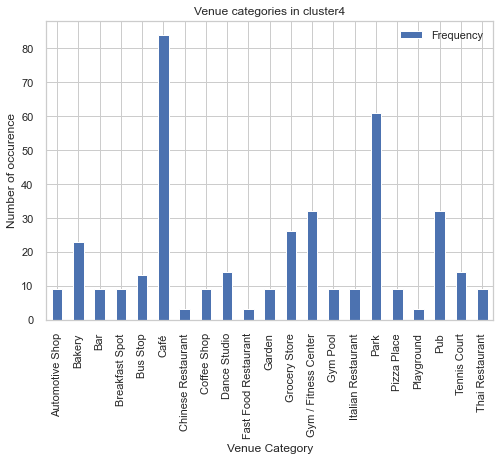

In [389]:
ax = e.plot(kind='bar')
ax.set_title('Venue categories in cluster4')
ax.set_xlabel('Venue Category')
ax.set_ylabel('Number of occurence')

### Cluster5

In [104]:
cluster5 = london_merged.loc[london_merged['Cluster Labels'] == 5]
cluster5.reset_index(drop=True,inplace=True)
cluster5

,Neighbourhood,Borough,Area,Crime count,Crime rate,Avg price,£/sqft,Latitude,Longitude,price_binned,...,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Anerley,Bromley,SE20,25802,77.6,384045.0,520.0,51.601511,-0.066365,Low £/sqft,...,Sporting Goods Shop,Bar,Hostel,Pub,Sandwich Place,Train Station,Recreation Center,Supermarket,Café,Mediterranean Restaurant
1,Aperfield,Bromley,TN16,25802,77.6,444540.0,411.0,51.601520,-0.065750,Low £/sqft,...,Sporting Goods Shop,Bar,Brewery,Mediterranean Restaurant,Recreation Center,Supermarket,Café,Soccer Stadium,Hostel,Sandwich Place
2,Bickley,Bromley,BR3,25802,77.6,448269.0,503.0,51.601380,-0.066960,High £/sqft,...,Sporting Goods Shop,Bar,Hostel,Pub,Sandwich Place,Train Station,Recreation Center,Supermarket,Café,Mediterranean Restaurant
3,Biggin Hill,Bromley,TN16,25802,77.6,444540.0,411.0,51.601520,-0.065750,Low £/sqft,...,Sporting Goods Shop,Bar,Brewery,Mediterranean Restaurant,Recreation Center,Supermarket,Café,Soccer Stadium,Hostel,Sandwich Place
4,Bromley Common,Bromley,BR3,25802,77.6,448269.0,503.0,51.601380,-0.066960,Low £/sqft,...,Sporting Goods Shop,Bar,Hostel,Pub,Sandwich Place,Train Station,Recreation Center,Supermarket,Café,Mediterranean Restaurant
5,Chelsfield,Bromley,BR6,25802,77.6,544046.0,474.0,51.601380,-0.066750,Medium £/sqft,...,Sporting Goods Shop,Bar,Hostel,Pub,Sandwich Place,Train Station,Recreation Center,Supermarket,Café,Mediterranean Restaurant
6,Chislehurst,Bromley,BR7,25802,77.6,597594.0,498.0,51.601380,-0.066670,Medium £/sqft,...,Sporting Goods Shop,Bar,Hostel,Pub,Sandwich Place,Train Station,Recreation Center,Supermarket,Café,Mediterranean Restaurant
7,Cudham,Bromley,TN14,25802,77.6,558240.0,455.0,51.601440,-0.066000,Medium £/sqft,...,Sporting Goods Shop,Bar,Brewery,Mediterranean Restaurant,Recreation Center,Supermarket,Café,Soccer Stadium,Hostel,Sandwich Place
8,Derry Downs,Bromley,BR5,25802,77.6,419770.0,427.0,51.601380,-0.066820,Medium £/sqft,...,Sporting Goods Shop,Bar,Hostel,Pub,Sandwich Place,Train Station,Recreation Center,Supermarket,Café,Mediterranean Restaurant
9,Downe,Bromley,BR6,25802,77.6,544046.0,474.0,51.601380,-0.066750,Medium £/sqft,...,Sporting Goods Shop,Bar,Hostel,Pub,Sandwich Place,Train Station,Recreation Center,Supermarket,Café,Mediterranean Restaurant


#### Boroughs and neighbourhoods in cluster5

In [150]:
borough5 = cluster5.groupby('Borough')['Area','Neighbourhood'].agg(lambda x: x.to_list())
borough5 = pd.DataFrame(borough5)
borough5.columns = ['Areas in cluster5','Neighbourhoods in cluster5']
borough5

<ipython-input-150-70be2084d4aa>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  borough5 = cluster5.groupby('Borough')['Area','Neighbourhood'].agg(lambda x: x.to_list())


,Areas in cluster5,Neighbourhoods in cluster5
Borough,,
Bromley,"[SE20, TN16, BR3, TN16, BR3, BR6, BR7, TN14, B...","[Anerley, Aperfield, Bickley, Biggin Hill, Bro..."


In [360]:
cluster5['Neighbourhood'].unique()

array(['Anerley', 'Aperfield', 'Bickley', 'Biggin Hill', 'Bromley Common',
       'Chelsfield', 'Chislehurst', 'Cudham', 'Derry Downs', 'Downe',
       'Eden Park', 'Elmers End', 'Elmstead', 'Goddington', 'Hayes',
       'Hazelwood', 'Keston', 'Leaves Green', 'Locksbottom', 'Mottingham',
       'Penge', 'Petts Wood', "Pratt's Bottom", 'Southborough',
       'St Mary Cray', "St Paul's Cray"], dtype=object)

#### Number of venue categories in cluster5

In [341]:
f = london_venues.loc[london_venues['Neighbourhood'].isin(cluster5['Neighbourhood'])].groupby('Venue Category')['Neighbourhood'].size()
f = pd.DataFrame(f)
f.columns = ['Frequency']
f

,Frequency
Venue Category,
Bar,52
Brewery,26
Café,26
Hostel,26
Mediterranean Restaurant,26
Pub,27
Recreation Center,26
Sandwich Place,26
Soccer Stadium,26


#### Bar plot showing venue categories

Text(0, 0.5, 'Number of occurence')

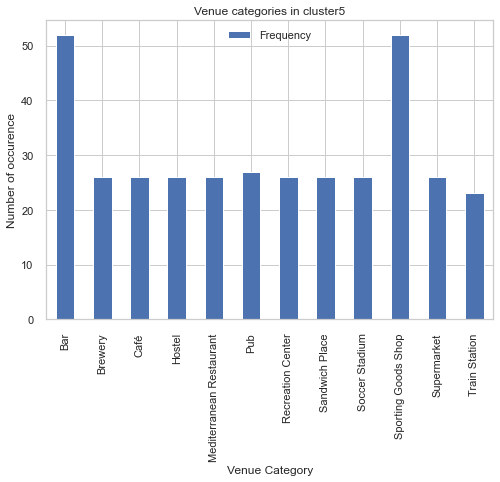

In [390]:
ax = f.plot(kind='bar')
ax.set_title('Venue categories in cluster5')
ax.set_xlabel('Venue Category')
ax.set_ylabel('Number of occurence')

### Cluster6

In [107]:
cluster6 = london_merged.loc[london_merged['Cluster Labels'] == 6]
cluster6.reset_index(drop=True,inplace=True)
cluster6

,Neighbourhood,Borough,Area,Crime count,Crime rate,Avg price,£/sqft,Latitude,Longitude,price_binned,...,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Harrow Weald,Harrow,HA3,17909,71.3,491667.0,478.0,51.63327,-0.07023,Low £/sqft,...,Park,Bakery,Museum,Film Studio,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Yoga Studio
1,Hatch End,Harrow,HA5,17909,71.3,576077.0,561.0,51.63325,-0.07012,Medium £/sqft,...,Park,Bakery,Museum,Film Studio,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Yoga Studio
2,Pinner,Harrow,HA5,17909,71.3,576077.0,561.0,51.63325,-0.07012,Low £/sqft,...,Park,Bakery,Museum,Film Studio,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Yoga Studio
3,Rayners Lane,Harrow,HA5,17909,71.3,576077.0,561.0,51.63325,-0.07012,Low £/sqft,...,Park,Bakery,Museum,Film Studio,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Yoga Studio
4,South Harrow,Harrow,HA2,17909,71.3,481380.0,493.0,51.63303,-0.07063,Low £/sqft,...,Park,Bakery,Museum,Home Service,Electronics Store,College Football Field,Farmers Market,Ethiopian Restaurant,Event Space,Falafel Restaurant
5,Wealdstone,Harrow,HA3,17909,71.3,491667.0,478.0,51.63327,-0.07023,Low £/sqft,...,Park,Bakery,Museum,Film Studio,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Yoga Studio
6,West Harrow,Harrow,HA2,17909,71.3,481380.0,493.0,51.63303,-0.07063,Low £/sqft,...,Park,Bakery,Museum,Home Service,Electronics Store,College Football Field,Farmers Market,Ethiopian Restaurant,Event Space,Falafel Restaurant


#### Boroughs and neighbourhoods in cluster6

In [381]:
borough6 = cluster6.groupby('Borough')['Area','Neighbourhood'].agg(lambda x: x.to_list())
borough6 = pd.DataFrame(borough6)
borough6.columns = ['Areas in cluster6','Neighbourhoods in cluster6']
borough6

<ipython-input-381-634c224045ef>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  borough6 = cluster6.groupby('Borough')['Area','Neighbourhood'].agg(lambda x: x.to_list())


,Areas in cluster6,Neighbourhoods in cluster6
Borough,,
Harrow,"[HA3, HA5, HA5, HA5, HA2, HA3, HA2]","[Harrow Weald, Hatch End, Pinner, Rayners Lane..."


In [361]:
cluster6['Neighbourhood'].unique()

array(['Harrow Weald', 'Hatch End', 'Pinner', 'Rayners Lane',
       'South Harrow', 'Wealdstone', 'West Harrow'], dtype=object)

#### Number of venue categories in cluster6

In [345]:
g = london_venues.loc[london_venues['Neighbourhood'].isin(cluster6['Neighbourhood'])].groupby('Venue Category')['Neighbourhood'].size()
g = pd.DataFrame(g)
g.columns = ['Frequency']
g

,Frequency
Venue Category,
Bakery,7
College Football Field,2
Electronics Store,2
Home Service,2
Museum,7
Park,14


#### Bar plot showing venue categories

Text(0, 0.5, 'Number of occurence')

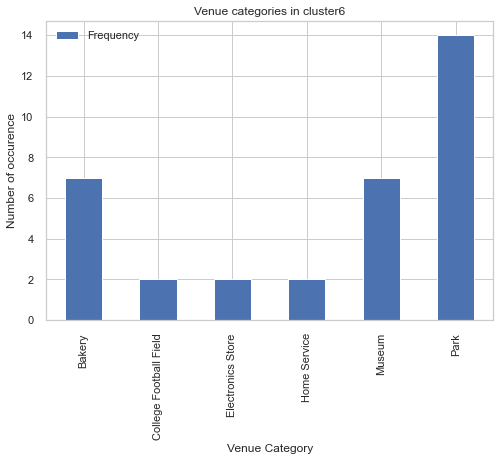

In [362]:
ax = g.plot(kind='bar')
ax.set_title('Venue categories in cluster6')
ax.set_xlabel('Venue Category')
ax.set_ylabel('Number of occurence')

### Cluster7

In [110]:
cluster7 = london_merged.loc[london_merged['Cluster Labels'] == 7]
cluster7.reset_index(drop=True,inplace=True)
cluster7

,Neighbourhood,Borough,Area,Crime count,Crime rate,Avg price,£/sqft,Latitude,Longitude,price_binned,...,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Aldwych,Westminster,WC2,73603,281.7,1692502.0,1017.0,51.62773,0.01322,Low £/sqft,...,Park,Pub,Athletics & Sports,Yoga Studio,Farmers Market,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Fast Food Restaurant
1,Bayswater,Westminster,W2,73603,281.7,1035301.0,1226.0,51.62773,0.01322,Low £/sqft,...,Park,Pub,Athletics & Sports,Yoga Studio,Farmers Market,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Fast Food Restaurant
2,Charing Cross,Westminster,WC2,73603,281.7,1692502.0,1017.0,51.62773,0.01322,Medium £/sqft,...,Park,Pub,Athletics & Sports,Yoga Studio,Farmers Market,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Fast Food Restaurant
3,Chinatown,Westminster,W1,73603,281.7,2542697.0,1177.0,51.62774,0.01319,Medium £/sqft,...,Park,Pub,Athletics & Sports,Yoga Studio,Farmers Market,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Fast Food Restaurant
4,Covent Garden,Westminster,WC2,73603,281.7,1692502.0,1017.0,51.62773,0.01322,Medium £/sqft,...,Park,Pub,Athletics & Sports,Yoga Studio,Farmers Market,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Fast Food Restaurant
5,Lisson Grove,Westminster,NW8,73603,281.7,1097470.0,1088.0,51.62772,0.01306,High £/sqft,...,Park,Pub,Athletics & Sports,Yoga Studio,Farmers Market,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Fast Food Restaurant
6,Maida Vale,Westminster,W9,73603,281.7,749526.0,958.0,51.62773,0.01288,High £/sqft,...,Park,Pub,Athletics & Sports,Yoga Studio,Farmers Market,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Fast Food Restaurant
7,Marylebone (also St Marylebone),Westminster,W1,73603,281.7,2542697.0,1177.0,51.62774,0.01319,High £/sqft,...,Park,Pub,Athletics & Sports,Yoga Studio,Farmers Market,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Fast Food Restaurant
8,Mayfair,Westminster,W1,73603,281.7,2542697.0,1177.0,51.62774,0.01319,High £/sqft,...,Park,Pub,Athletics & Sports,Yoga Studio,Farmers Market,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Fast Food Restaurant
9,Paddington,Westminster,W2,73603,281.7,1035301.0,1226.0,51.62773,0.01322,Low £/sqft,...,Park,Pub,Athletics & Sports,Yoga Studio,Farmers Market,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Fast Food Restaurant


#### Boroughs and areas in cluster7

In [153]:
borough7 = cluster7.groupby('Borough')['Area', 'Neighbourhood'].agg(lambda x: x.to_list())
borough7 = pd.DataFrame(borough7)
borough7.columns = ['Areas in cluster7','Neighbourhoods in cluster7']
borough7

<ipython-input-153-463cc0e797fe>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  borough7 = cluster7.groupby('Borough')['Area', 'Neighbourhood'].agg(lambda x: x.to_list())


,Areas in cluster7,Neighbourhoods in cluster7
Borough,,
Brent,"[NW9, HA9, HA9, HA9]","[Kingsbury, Preston, Tokyngton, Wembley Park]"
Waltham Forest,"[E11, E4, E4, E11, E17, E17, E17]","[Cann Hall, Chingford, Highams Park, Leytonsto..."
Westminster,"[WC2, W2, WC2, W1, WC2, NW8, W9, W1, W1, W2, W...","[Aldwych, Bayswater, Charing Cross, Chinatown,..."


In [396]:
cluster7.loc[cluster7['Borough']=='Westminster']['Neighbourhood'].tolist()

['Aldwych',
 'Bayswater',
 'Charing Cross',
 'Chinatown',
 'Covent Garden',
 'Lisson Grove',
 'Maida Vale',
 'Marylebone (also St Marylebone)',
 'Mayfair',
 'Paddington',
 'Soho',
 "St John's Wood"]

#### Venue categories in cluster7

In [348]:
h = london_venues.loc[london_venues['Neighbourhood'].isin(cluster7['Neighbourhood'])].groupby('Venue Category')['Neighbourhood'].size()
h = pd.DataFrame(h)
h.columns = ['Frequency']
h

,Frequency
Venue Category,
Athletics & Sports,16
Bar,5
Bus Station,2
Golf Course,4
Park,30
Pub,19
Tennis Court,4


#### Bar plot showing venue categories

Text(0, 0.5, 'Number of occurence')

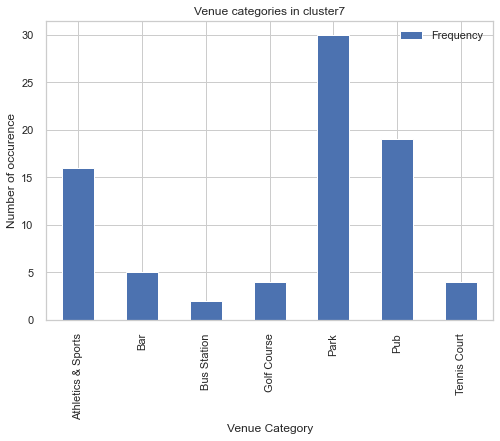

In [363]:
ax = h.plot(kind='bar')
ax.set_title('Venue categories in cluster7')
ax.set_xlabel('Venue Category')
ax.set_ylabel('Number of occurence')

### Retrieve the number of top three venue categories in each neighbourhood

In [155]:
top3 = london_venues.groupby(['Neighbourhood','Venue Category']).size().reset_index(name='Counts')
top3 = top3.sort_values(['Neighbourhood','Counts'],ascending=False).groupby('Neighbourhood').head(3).reset_index(drop=True)

top3['Number of common venues'] = top3['Counts'].map(str) + " " + top3['Venue Category']
top3 = top3.groupby(['Neighbourhood'])['Number of common venues'].apply(", ".join).reset_index()

top3.head()

,Neighbourhood,Number of common venues
0,Addington,"2 Pizza Place, 2 Platform, 1 Bakery"
1,Addiscombe,"2 Pizza Place, 2 Platform, 1 Bakery"
2,Aldborough Hatch,"2 Bus Stop, 2 Grocery Store, 2 Park"
3,Aldwych,"1 Athletics & Sports, 1 Park, 1 Pub"
4,Alperton,"2 Park, 1 Bagel Shop, 1 Bus Stop"


In [156]:
top3.describe(include='all')

,Neighbourhood,Number of common venues
count,411,411
unique,411,83
top,Southborough,"2 Bar, 2 Sporting Goods Shop, 1 Brewery"
freq,1,22


#### Merge with 'London merged' dataframe

In [157]:
common_venues_comb = pd.merge(left=london_merged, right=top3)
common_venues_comb.head()

,Neighbourhood,Borough,Area,Crime count,Crime rate,Avg price,£/sqft,Latitude,Longitude,price_binned,...,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Number of common venues
0,Addington,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Pizza Place,Dessert Shop,Bakery,Grocery Store,Dosa Place,Supermarket,Coffee Shop,Fast Food Restaurant,Pub,"2 Pizza Place, 2 Platform, 1 Bakery"
1,Addiscombe,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Pizza Place,Dessert Shop,Bakery,Grocery Store,Dosa Place,Supermarket,Coffee Shop,Fast Food Restaurant,Pub,"2 Pizza Place, 2 Platform, 1 Bakery"
2,Coombe,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Café,Pizza Place,Italian Restaurant,Supermarket,Indian Restaurant,Platform,Food,Fast Food Restaurant,Bakery,"3 Pub, 2 Café, 2 Food"
3,Coombe,Kingston upon Thames,KT2,13221,74.5,560693.0,650.0,51.410881,-0.291933,Low £/sqft,...,Café,Pizza Place,Italian Restaurant,Supermarket,Indian Restaurant,Platform,Food,Fast Food Restaurant,Bakery,"3 Pub, 2 Café, 2 Food"
4,Coulsdon,Croydon,CR5,36790,95.1,530180.0,437.0,51.405360,-0.065540,Low £/sqft,...,Café,Park,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,English Restaurant,"1 Café, 1 Grocery Store, 1 Park"


#### View on a map

In [369]:
# create map
map_clusters_comb = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, borough, cluster, join in zip(common_venues_comb['Latitude'], 
                                  common_venues_comb['Longitude'], 
                                  common_venues_comb['Neighbourhood'],
                                  common_venues_comb['Borough'],
                                  common_venues_comb['Cluster Labels'],
                                  common_venues_comb['Number of common venues']):
    if cluster == 0:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=6, popup=label, color='green',fill=True,fill_color='green',fill_opacity=2.0,parse_html=False).add_to(map_clusters_comb)
    
    elif cluster == 1:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='blue',fill=True,fill_color='blue',fill_opacity=2.0,parse_html=False).add_to(map_clusters_comb)
    elif cluster == 2:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='purple',fill=True,fill_color='purple',fill_opacity=2.0,parse_html=False).add_to(map_clusters_comb)
    elif cluster == 3:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='red',fill=True,fill_color='red',fill_opacity=2.0,parse_html=False).add_to(map_clusters_comb)
    elif cluster == 4:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='orange',fill=True,fill_color='orange',fill_opacity=2.0,parse_html=False).add_to(map_clusters_comb)
    elif cluster == 5:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='brown',fill=True,fill_color='brown',fill_opacity=2.0,parse_html=False).add_to(map_clusters_comb)
    elif cluster == 6:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='pink',fill=True,fill_color='pink',fill_opacity=2.0,parse_html=False).add_to(map_clusters_comb)
    elif cluster == 7:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='yellow',fill=True,fill_color='yellow',fill_opacity=2.0,parse_html=False).add_to(map_clusters_comb)
        
map_clusters_comb

#### From the analysis, cluster3 has the most neighbourhoods
Let's visualize the neighbourhoods in cluster3 on the map

In [179]:
common3 = common_venues_comb.loc[common_venues_comb['Cluster Labels']==3]
common3.head()

,Neighbourhood,Borough,Area,Crime count,Crime rate,Avg price,£/sqft,Latitude,Longitude,price_binned,...,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Number of common venues
0,Addington,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Pizza Place,Dessert Shop,Bakery,Grocery Store,Dosa Place,Supermarket,Coffee Shop,Fast Food Restaurant,Pub,"2 Pizza Place, 2 Platform, 1 Bakery"
1,Addiscombe,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Pizza Place,Dessert Shop,Bakery,Grocery Store,Dosa Place,Supermarket,Coffee Shop,Fast Food Restaurant,Pub,"2 Pizza Place, 2 Platform, 1 Bakery"
2,Coombe,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Café,Pizza Place,Italian Restaurant,Supermarket,Indian Restaurant,Platform,Food,Fast Food Restaurant,Bakery,"3 Pub, 2 Café, 2 Food"
3,Coombe,Kingston upon Thames,KT2,13221,74.5,560693.0,650.0,51.410881,-0.291933,Low £/sqft,...,Café,Pizza Place,Italian Restaurant,Supermarket,Indian Restaurant,Platform,Food,Fast Food Restaurant,Bakery,"3 Pub, 2 Café, 2 Food"
5,Croydon,Croydon,CR0,36790,95.1,343090.0,439.0,51.381893,-0.106196,Low £/sqft,...,Pizza Place,Dessert Shop,Bakery,Grocery Store,Dosa Place,Supermarket,Coffee Shop,Fast Food Restaurant,Pub,"2 Pizza Place, 2 Platform, 1 Bakery"


In [403]:
# create map
map_cluster3 = folium.Map(location=[latitude, longitude], zoom_start=11)



# add markers to the map
markers_colors = []
for lat, lon, poi, borough, cluster, join in zip(common3['Latitude'], 
                                  common3['Longitude'], 
                                  common3['Neighbourhood'],
                                  common3['Borough'],
                                  common3['Cluster Labels'],
                                  common3['Number of common venues']):
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)    
        folium.CircleMarker(
        [lat, lon],
        radius=8,
        popup=label,
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.7).add_to(map_cluster3)
       
map_cluster3

#### View all the clusters on the crime rate choroplrth map

In [404]:
london_cluster_map = folium.Map(location=[latitude, longitude], zoom_start=10, 
                         min_zoom=9, max_zoom=11)
london_cluster_map.choropleth(
    geo_data=london_json,
    data=combined_borough_crime,
    columns=['Neighbourhood', 'Crime rate'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Crime rates in London, 2020'
)


markers_colors = []
for lat, lon, poi, borough, cluster, join in zip(common_venues_comb['Latitude'], 
                                  common_venues_comb['Longitude'], 
                                  common_venues_comb['Neighbourhood'],
                                  common_venues_comb['Borough'],
                                  common_venues_comb['Cluster Labels'],
                                  common_venues_comb['Number of common venues']):
    if cluster == 0:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=6, popup=label, color='green',fill=True,fill_color='green',fill_opacity=2.0,parse_html=False).add_to(london_cluster_map)
    
    elif cluster == 1:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='blue',fill=True,fill_color='blue',fill_opacity=2.0,parse_html=False).add_to(london_cluster_map)
    elif cluster == 2:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='purple',fill=True,fill_color='purple',fill_opacity=2.0,parse_html=False).add_to(london_cluster_map)
    elif cluster == 3:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='red',fill=True,fill_color='red',fill_opacity=2.0,parse_html=False).add_to(london_cluster_map)
    elif cluster == 4:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='orange',fill=True,fill_color='orange',fill_opacity=2.0,parse_html=False).add_to(london_cluster_map)
    elif cluster == 5:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='brown',fill=True,fill_color='brown',fill_opacity=2.0,parse_html=False).add_to(london_cluster_map)
    elif cluster == 6:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='pink',fill=True,fill_color='pink',fill_opacity=2.0,parse_html=False).add_to(london_cluster_map)
    elif cluster == 7:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='yellow',fill=True,fill_color='yellow',fill_opacity=2.0,parse_html=False).add_to(london_cluster_map)
        

#display map
london_cluster_map

### Visualize the clusters on choropleth map showing average house sale price and average price per sqft

#### Average house sale price

In [174]:
avg_price = london_data_comb.groupby('Borough')['Avg price'].mean()
avg_price = pd.DataFrame(avg_price)
avg_price.reset_index(inplace=True)
avg_price.head()

,Borough,Avg price
0,Barking and Dagenham,322542.142857
1,Barnet,573721.428571
2,Bexley,369716.650000
3,Brent,529521.692308
4,Bromley,477292.833333


In [407]:
avg_price_map = folium.Map(location=[latitude, longitude], zoom_start=10, 
                         min_zoom=9, max_zoom=11)
avg_price_map.choropleth(
    geo_data=london_json,
    data=avg_price,
    columns=['Borough', 'Avg price'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Average house sale prices'
)
markers_colors = []
for lat, lon, poi, borough, cluster, join in zip(common_venues_comb['Latitude'], 
                                  common_venues_comb['Longitude'], 
                                  common_venues_comb['Neighbourhood'],
                                  common_venues_comb['Borough'],
                                  common_venues_comb['Cluster Labels'],
                                  common_venues_comb['Number of common venues']):
    if cluster == 0:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=6, popup=label, color='green',fill=True,fill_color='green',fill_opacity=2.0,parse_html=False).add_to(avg_price_map)
    
    elif cluster == 1:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='blue',fill=True,fill_color='blue',fill_opacity=2.0,parse_html=False).add_to(avg_price_map)
    elif cluster == 2:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='purple',fill=True,fill_color='purple',fill_opacity=2.0,parse_html=False).add_to(avg_price_map)
    elif cluster == 3:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='red',fill=True,fill_color='red',fill_opacity=2.0,parse_html=False).add_to(avg_price_map)
    elif cluster == 4:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='orange',fill=True,fill_color='orange',fill_opacity=2.0,parse_html=False).add_to(avg_price_map)
    elif cluster == 5:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='brown',fill=True,fill_color='brown',fill_opacity=2.0,parse_html=False).add_to(avg_price_map)
    elif cluster == 6:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='pink',fill=True,fill_color='pink',fill_opacity=2.0,parse_html=False).add_to(avg_price_map)
    elif cluster == 7:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='yellow',fill=True,fill_color='yellow',fill_opacity=2.0,parse_html=False).add_to(avg_price_map)
        
avg_price_map

It looks like the more expensive houses are in the middle of London

#### Average price per sqft

In [177]:
avg_sqft = london_data_comb.groupby('Borough')['£/sqft'].mean()
avg_sqft = pd.DataFrame(avg_sqft)
avg_sqft.reset_index(inplace=True)
avg_sqft.head()

,Borough,£/sqft
0,Barking and Dagenham,377.142857
1,Barnet,550.178571
2,Bexley,389.100000
3,Brent,621.846154
4,Bromley,468.933333


In [408]:
avg_sqft_map = folium.Map(location=[latitude, longitude], zoom_start=10, 
                         min_zoom=9, max_zoom=11)
avg_sqft_map.choropleth(
    geo_data=london_json,
    data=avg_sqft,
    columns=['Borough', '£/sqft'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Average house prices per sqft'
)
markers_colors = []
for lat, lon, poi, borough, cluster, join in zip(common_venues_comb['Latitude'], 
                                  common_venues_comb['Longitude'], 
                                  common_venues_comb['Neighbourhood'],
                                  common_venues_comb['Borough'],
                                  common_venues_comb['Cluster Labels'],
                                  common_venues_comb['Number of common venues']):
    if cluster == 0:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=6, popup=label, color='green',fill=True,fill_color='green',fill_opacity=2.0,parse_html=False).add_to(avg_sqft_map)
    
    elif cluster == 1:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='blue',fill=True,fill_color='blue',fill_opacity=2.0,parse_html=False).add_to(avg_sqft_map)
    elif cluster == 2:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='purple',fill=True,fill_color='purple',fill_opacity=2.0,parse_html=False).add_to(avg_sqft_map)
    elif cluster == 3:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='red',fill=True,fill_color='red',fill_opacity=2.0,parse_html=False).add_to(avg_sqft_map)
    elif cluster == 4:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='orange',fill=True,fill_color='orange',fill_opacity=2.0,parse_html=False).add_to(avg_sqft_map)
    elif cluster == 5:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='brown',fill=True,fill_color='brown',fill_opacity=2.0,parse_html=False).add_to(avg_sqft_map)
    elif cluster == 6:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='pink',fill=True,fill_color='pink',fill_opacity=2.0,parse_html=False).add_to(avg_sqft_map)
    elif cluster == 7:
        label = folium.Popup(str(poi) +', '+str(borough) + '; Cluster: ' + str(cluster)+'; ' +str(join), parse_html=True)
        folium.CircleMarker([lat, lon], radius=5, popup=label, color='yellow',fill=True,fill_color='yellow',fill_opacity=2.0,parse_html=False).add_to(avg_sqft_map)
        
avg_sqft_map

From here, we can also see the most expensive houses are in the middle of London

### Find boroughs below the median crime rate

In [164]:
median_crime = london_data_comb['Crime rate'].median()
median_crime

96.1

#### Box plot showing crime rates

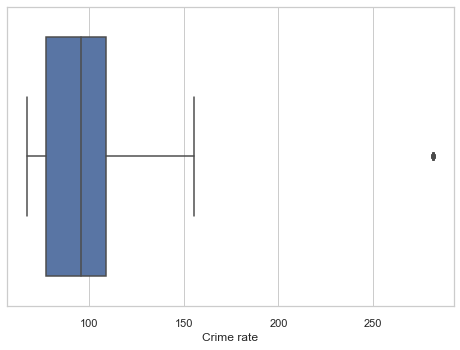

In [166]:
sns.set_theme(style="whitegrid")
tips = sns.load_dataset("tips")
ax = sns.boxplot(x=london_data_comb['Crime rate'])
plt.show()

#### Boroughs below median crime rate

In [382]:
high_crime = london_data_comb.loc[london_data_comb['Crime rate']>96.15].index
low_crime = london_data_comb.drop(high_crime, axis=0)
low_crime = low_crime.groupby('Borough')['Crime rate','Crime count'].mean()
low_crime.reset_index(inplace=True)
low_crime['Borough'].unique()

<ipython-input-382-9300e0f8f633>:3: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  low_crime = low_crime.groupby('Borough')['Crime rate','Crime count'].mean()


array(['Barnet', 'Bexley', 'Bromley', 'Croydon', 'Ealing', 'Enfield',
       'Harrow', 'Havering', 'Hillingdon', 'Kingston upon Thames',
       'Merton', 'Redbridge', 'Richmond upon Thames', 'Sutton',
       'Waltham Forest', 'Wandsworth'], dtype=object)

In [383]:
low_price = london_data_comb[london_data_comb['price_binned']=='Low £/sqft']
low_price.reset_index(drop=True, inplace=True)
low_price['Borough'].unique()

array(['Croydon', 'Bexley', 'Redbridge', 'Westminster', 'Brent',
       'Bromley', 'Islington', 'Havering', 'Barnet', 'Enfield',
       'Wandsworth', 'Southwark', 'Barking and Dagenham',
       'Richmond upon Thames', 'Newham', 'Sutton', 'Ealing', 'Lewisham',
       'Harrow', 'Camden', 'Kingston upon Thames', 'Tower Hamlets',
       'Greenwich', 'Haringey', 'Hounslow', 'Waltham Forest',
       'Kensington and Chelsea', 'Merton', 'Hillingdon', 'Hackney',
       'Hammersmith and Fulham'], dtype=object)

### Ideal boroughs

In [411]:
ideal = pd.merge(left=low_crime['Borough'], right=low_price['Borough'])
ideal_boroughs = ideal['Borough'].unique()
ideal_boroughs = pd.DataFrame(ideal_boroughs)
ideal_boroughs.columns = ['Ideal boroughs']
ideal_boroughs['Ideal boroughs'].unique()

array(['Barnet', 'Bexley', 'Bromley', 'Croydon', 'Ealing', 'Enfield',
       'Harrow', 'Havering', 'Hillingdon', 'Kingston upon Thames',
       'Merton', 'Redbridge', 'Richmond upon Thames', 'Sutton',
       'Waltham Forest', 'Wandsworth'], dtype=object)

These are the boroughs with low crime rate and average price per sqft

## Discussion
The aim of this project was to make it easy for anyone intersted in the project easily understand the results of the project. We were able to cluster over 400 neighbourhoods in London containing 266 venue categories using K Means clustering algorithm. Nine clusters were obtained. We analyzed each cluster and showed the number of each of the most common venue category. Pubs, parks and cafés were among the most common venues overall. Cluster3 had the most number of venue categories. We retrieved the top three most common venues for each neighbourhood. The top three were selected because some neighbourhoods had very few venues. 
We were able to visualize the crime rates and average house sale prices on the map of London. 
Finally, we retrieved the boroughs with low average house sale price and crime rates.


## Conclusion
This project mainly focused on crime rates, house prices and common venues as criteria for choosing a neighbourhood to move to. There are other factors that people put into consideration before they move, but these are some of the most important ones. Therefore, the results of this project can be a good place to start for anyone that wants to move to London.